In [1]:
!pip install -q gdown
DATA_ID = "1YzRfUeD6LOru8fdzQi4ElmkqpibxarEK"  # same file ID
!gdown {DATA_ID} -O data.zip
!unzip -q data.zip -d data/


Downloading...
From (original): https://drive.google.com/uc?id=1YzRfUeD6LOru8fdzQi4ElmkqpibxarEK
From (redirected): https://drive.google.com/uc?id=1YzRfUeD6LOru8fdzQi4ElmkqpibxarEK&confirm=t&uuid=c76ea441-50f5-4341-997b-0ea015198e14
To: /content/data.zip
100% 69.0M/69.0M [00:00<00:00, 71.2MB/s]


In [ ]:
import os, random, numpy as np, torch, cv2, ultralytics

SEED = 1337
os.environ["PYTHONHASHSEED"] = str(SEED)
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":16:8"

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
torch.use_deterministic_algorithms(True, warn_only=True)

print("numpy:", np.__version__, "| opencv:", cv2.__version__, "| ultralytics:", ultralytics.__version__)
print("Repro seed set =", SEED)


numpy: 2.2.6 | opencv: 4.12.0 | ultralytics: 8.3.179
Repro seed set = 1337


In [ ]:
# 1️⃣ Install YOLOv8
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 53.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 127.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 29.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


**DATASETS**

In [ ]:
ROOT = "/content/drive/MyDrive/CAPSTONE"

# destinations in Colab
!mkdir -p /content/data/stage1 /content/data/stage2

# unzip
!unzip -q -o "{ROOT}/Data_stage1.zip" -d "/content/data/stage1"
!unzip -q -o "{ROOT}/Data_stage2.zip" -d "/content/data/stage2"


In [ ]:
!find /content/data -maxdepth 3 -type d | grep -E 'stage|train|valid|test|images|labels'


/content/data/stage2
/content/data/stage2/train
/content/data/stage2/train/images
/content/data/stage2/train/labels
/content/data/stage2/valid
/content/data/stage2/valid/images
/content/data/stage2/valid/labels
/content/data/stage1
/content/data/stage1/train
/content/data/stage1/train/images
/content/data/stage1/train/labels
/content/data/stage1/valid
/content/data/stage1/valid/images
/content/data/stage1/valid/labels


**YAML PATHS**

In [ ]:
# Create Stage-1 YAML (cropped signs)
stage1_yaml = """train: /content/data/stage1/train/images
val:   /content/data/stage1/valid/images
nc: 1
names: [speedlimits]
"""
with open("/content/speedlimits_stage1.yaml","w") as f:
    f.write(stage1_yaml)

# Create Stage-2 YAML (driver POV)
stage2_yaml = """train: /content/data/stage2/train/images
val:   /content/data/stage2/valid/images
nc: 1
names: [speedlimits]
"""
with open("/content/carla_pov_stage2.yaml","w") as f:
    f.write(stage2_yaml)

#  to confirm
print(open("/content/speedlimits_stage1.yaml").read())
print(open("/content/carla_pov_stage2.yaml").read())


train: /content/data/stage1/train/images
val:   /content/data/stage1/valid/images
nc: 1
names: [speedlimits]

train: /content/data/stage2/train/images
val:   /content/data/stage2/valid/images
nc: 1
names: [speedlimits]



**STAGE 1 Training**

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')
yaml_path = "/content/speedlimits_stage1.yaml"

model.train(
    data=yaml_path,
    epochs=50, patience=10, imgsz=640, batch=16, workers=2, device=0,
    project="/content/drive/MyDrive/CAPSTONE/runs_speedlimits",
    name="stage1_cropped_safe",
    save_period=10, pretrained=True
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/speedlimits_stage1.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=stage1_cropped_safe2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.0, plots=True, pose=1

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

Model summary: 129 layers, 3,011,043 parameters, 3,011,027 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1050.7±468.1 MB/s, size: 30.5 KB)


train: Scanning /content/data/stage1/train/labels... 984 images, 1 backgrounds, 0 corrupt: 100%|██████████| 984/984 [00:00<00:00, 2307.17it/s]

train: /content/data/stage1/train/images/speed_30_100_jpg.rf.2414e475ca58aafa00c99744343bddfd.jpg: 2 duplicate labels removed
train: /content/data/stage1/train/images/speed_30_101_jpg.rf.edb1bd12ec12f5335b66e2d91d32048f.jpg: 1 duplicate labels removed
train: /content/data/stage1/train/images/speed_30_68_jpg.rf.9821b3cbd59d2bcffd709e294f92189b.jpg: 1 duplicate labels removed
train: New cache created: /content/data/stage1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 518.6±243.1 MB/s, size: 29.4 KB)


val: Scanning /content/data/stage1/valid/labels... 245 images, 0 backgrounds, 0 corrupt: 100%|██████████| 245/245 [00:00<00:00, 1946.64it/s]

val: /content/data/stage1/valid/images/speed_30_109_jpg.rf.4a960ffc994f8bc0a458064840d39043.jpg: 1 duplicate labels removed
val: New cache created: /content/data/stage1/valid/labels.cache


Plotting labels to /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage1_cropped_safe2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage1_cropped_safe2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.03G     0.4823      1.183      1.173         23        640: 100%|██████████| 62/62 [00:20<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.92it/s]

                   all        245        245      0.267      0.396      0.135     0.0276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.51G     0.3123     0.5871      1.023         23        640: 100%|██████████| 62/62 [00:17<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.56it/s]


                   all        245        245      0.975       0.98      0.992       0.87

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.53G     0.3077     0.4876      1.012         24        640: 100%|██████████| 62/62 [00:18<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.40it/s]


                   all        245        245      0.677       0.78      0.757       0.61

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.54G     0.3058     0.4206      1.018         26        640: 100%|██████████| 62/62 [00:17<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.77it/s]

                   all        245        245      0.192      0.249     0.0963     0.0327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.56G      0.292     0.3789      1.006         23        640: 100%|██████████| 62/62 [00:17<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.08it/s]

                   all        245        245      0.979      0.951       0.99      0.944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.58G     0.2529     0.3259     0.9774         27        640: 100%|██████████| 62/62 [00:19<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.77it/s]

                   all        245        245       0.99      0.992      0.993      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.59G     0.2444     0.3113     0.9701         30        640: 100%|██████████| 62/62 [00:17<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.06it/s]

                   all        245        245      0.817      0.955      0.968      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.61G     0.2238     0.2844     0.9739         24        640: 100%|██████████| 62/62 [00:18<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.54it/s]

                   all        245        245      0.992      0.992      0.995      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.62G     0.2091     0.2667     0.9614         25        640: 100%|██████████| 62/62 [00:17<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]


                   all        245        245      0.975      0.946      0.982       0.88

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.65G     0.2071     0.2562     0.9486         23        640: 100%|██████████| 62/62 [00:17<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.40it/s]

                   all        245        245      0.972          1      0.995      0.984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.66G     0.1949     0.2423     0.9464         25        640: 100%|██████████| 62/62 [00:17<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.09it/s]

                   all        245        245      0.998          1      0.995      0.988



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.68G     0.1833     0.2249     0.9448         26        640: 100%|██████████| 62/62 [00:17<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.86it/s]

                   all        245        245          1          1      0.995      0.943



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.69G     0.1726     0.2211     0.9354         25        640: 100%|██████████| 62/62 [00:17<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.91it/s]

                   all        245        245      0.996      0.996      0.995      0.985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.72G     0.1693     0.2191     0.9376         19        640: 100%|██████████| 62/62 [00:17<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.64it/s]


                   all        245        245      0.994          1      0.995      0.893

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.73G     0.1649     0.1997     0.9367         23        640: 100%|██████████| 62/62 [00:18<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.51it/s]

                   all        245        245          1          1      0.995      0.992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.75G     0.1462     0.1937     0.9273         22        640: 100%|██████████| 62/62 [00:17<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.83it/s]

                   all        245        245      0.996          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.76G     0.1468     0.1934     0.9235         27        640: 100%|██████████| 62/62 [00:18<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.84it/s]

                   all        245        245          1          1      0.995      0.988



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.79G     0.1382     0.1818     0.9195         24        640: 100%|██████████| 62/62 [00:17<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.82it/s]

                   all        245        245      0.981      0.988      0.995       0.96



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50       2.8G     0.1362     0.1819      0.918         25        640: 100%|██████████| 62/62 [00:17<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.17it/s]

                   all        245        245      0.999          1      0.995       0.99



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.82G     0.1359     0.1829     0.9192         24        640: 100%|██████████| 62/62 [00:18<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.79it/s]

                   all        245        245          1          1      0.995      0.989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.83G      0.133     0.1783     0.9177         27        640: 100%|██████████| 62/62 [00:17<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.04it/s]

                   all        245        245      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.85G      0.121     0.1654     0.9178         26        640: 100%|██████████| 62/62 [00:18<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.71it/s]

                   all        245        245          1          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.87G     0.1251      0.161      0.914         23        640: 100%|██████████| 62/62 [00:17<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.98it/s]

                   all        245        245      0.996          1      0.995      0.985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.89G      0.119     0.1663     0.9086         23        640: 100%|██████████| 62/62 [00:17<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.56it/s]

                   all        245        245      0.983          1      0.991      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       2.9G     0.1115     0.1565     0.9095         28        640: 100%|██████████| 62/62 [00:17<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.19it/s]

                   all        245        245      0.996          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.92G     0.1089     0.1552     0.9092         17        640: 100%|██████████| 62/62 [00:17<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]

                   all        245        245      0.999          1      0.995      0.994
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 16, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



26 epochs completed in 0.150 hours.
Optimizer stripped from /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage1_cropped_safe2/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage1_cropped_safe2/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage1_cropped_safe2/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:06<00:00,  1.31it/s]


                   all        245        245      0.996          1      0.995      0.995
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms loss, 8.4ms postprocess per image
Results saved to /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage1_cropped_safe2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79cf91c9a610>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

**STAGE 2 Training on the best.pt from Stage 1**

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage1_cropped_safe/weights/best.pt")
model.train(
    data="/content/carla_pov_stage2.yaml",
    epochs=50,
    imgsz=640,
    batch=8,
    patience=10,
    workers=2,
    device=0,
    project="/content/drive/MyDrive/CAPSTONE/runs_speedlimits",
    name="stage2_finetune",
)


Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/carla_pov_stage2.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage1_cropped_safe/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=stage2_finetune2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, 

train: Scanning /content/data/stage2/train/labels... 207 images, 0 backgrounds, 0 corrupt: 100%|██████████| 207/207 [00:00<00:00, 1962.96it/s]

train: New cache created: /content/data/stage2/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 273.6±65.1 MB/s, size: 36.2 KB)


val: Scanning /content/data/stage2/valid/labels... 52 images, 0 backgrounds, 0 corrupt: 100%|██████████| 52/52 [00:00<00:00, 1906.05it/s]

val: New cache created: /content/data/stage2/valid/labels.cache


Plotting labels to /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       1.3G      3.481      24.81      2.212          5        640: 100%|██████████| 26/26 [00:04<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.80it/s]

                   all         52         52    0.00291       0.75    0.00313    0.00116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.49G      2.076      3.464      1.456         12        640: 100%|██████████| 26/26 [00:04<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.19it/s]

                   all         52         52    0.00358      0.923      0.021     0.0111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.49G      1.597      2.401      1.254         11        640: 100%|██████████| 26/26 [00:04<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.41it/s]

                   all         52         52      0.825      0.558       0.66      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.49G      1.367      1.487      1.141          7        640: 100%|██████████| 26/26 [00:04<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.35it/s]

                   all         52         52      0.907      0.746      0.864       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.49G      1.227      1.249       1.08          7        640: 100%|██████████| 26/26 [00:05<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.21it/s]

                   all         52         52      0.896      0.846      0.941      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.49G      1.157      1.066      1.065         12        640: 100%|██████████| 26/26 [00:03<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.14it/s]

                   all         52         52      0.924       0.94      0.965       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.49G        1.1     0.9698       1.02         13        640: 100%|██████████| 26/26 [00:03<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.04it/s]

                   all         52         52          1      0.881      0.979      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.49G      1.078     0.8641      0.989         11        640: 100%|██████████| 26/26 [00:05<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.17it/s]

                   all         52         52      0.975      0.962       0.99      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.49G     0.9734     0.7726     0.9471         10        640: 100%|██████████| 26/26 [00:03<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.62it/s]

                   all         52         52      0.997      0.962      0.993      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.49G     0.9748     0.8039     0.9712         11        640: 100%|██████████| 26/26 [00:04<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.54it/s]

                   all         52         52      0.952      0.981      0.993      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.49G     0.9093      0.759     0.9945          9        640: 100%|██████████| 26/26 [00:04<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.11it/s]

                   all         52         52          1      0.978      0.994      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.51G       0.85     0.6825     0.9721          9        640: 100%|██████████| 26/26 [00:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.44it/s]

                   all         52         52      0.998          1      0.995      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.52G      0.836     0.6469     0.9184          9        640: 100%|██████████| 26/26 [00:04<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.45it/s]

                   all         52         52      0.999      0.981      0.995      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.54G     0.8315     0.6379     0.9348         11        640: 100%|██████████| 26/26 [00:04<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.09it/s]

                   all         52         52      0.998          1      0.995      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.56G     0.7633     0.5878     0.9356         12        640: 100%|██████████| 26/26 [00:03<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.97it/s]

                   all         52         52          1      0.979      0.995      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.57G     0.8128     0.6319     0.9345          7        640: 100%|██████████| 26/26 [00:05<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.81it/s]

                   all         52         52      0.976          1      0.994       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.59G     0.7627     0.5805     0.9253          9        640: 100%|██████████| 26/26 [00:04<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.91it/s]

                   all         52         52      0.992          1      0.995      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.61G      0.738     0.5655     0.8975          6        640: 100%|██████████| 26/26 [00:04<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.56it/s]

                   all         52         52      0.999          1      0.995      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.62G     0.6769     0.5308     0.8643         10        640: 100%|██████████| 26/26 [00:04<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.67it/s]

                   all         52         52      0.979          1      0.994      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.64G     0.7867     0.5463     0.9359          8        640: 100%|██████████| 26/26 [00:03<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.86it/s]

                   all         52         52          1      0.981      0.995      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.66G     0.7217     0.5279     0.8708          9        640: 100%|██████████| 26/26 [00:05<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.87it/s]


                   all         52         52      0.997          1      0.995      0.841

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.68G     0.7168     0.5222     0.8867          9        640: 100%|██████████| 26/26 [00:03<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.01it/s]

                   all         52         52      0.998          1      0.995      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.69G     0.7099     0.4895     0.8942          8        640: 100%|██████████| 26/26 [00:03<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.37it/s]

                   all         52         52      0.998          1      0.995      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.71G     0.6693     0.4818     0.8632          7        640: 100%|██████████| 26/26 [00:05<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.33it/s]

                   all         52         52      0.998          1      0.995      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.73G     0.7005     0.5009     0.8876          7        640: 100%|██████████| 26/26 [00:03<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.69it/s]

                   all         52         52      0.998          1      0.995      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.74G     0.6547     0.4712      0.905          9        640: 100%|██████████| 26/26 [00:04<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.35it/s]

                   all         52         52      0.999          1      0.995      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.76G     0.6533     0.4511     0.8754         14        640: 100%|██████████| 26/26 [00:04<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.06it/s]

                   all         52         52      0.998          1      0.995      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.78G     0.6699     0.4764     0.8768          7        640: 100%|██████████| 26/26 [00:04<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.60it/s]

                   all         52         52      0.991          1      0.995      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.79G     0.6681     0.4631     0.8971          7        640: 100%|██████████| 26/26 [00:05<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.17it/s]

                   all         52         52      0.998          1      0.995      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.81G     0.6853     0.4579      0.897         11        640: 100%|██████████| 26/26 [00:03<00:00,  6.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.44it/s]

                   all         52         52      0.999          1      0.995      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.83G      0.649     0.4653     0.8723         11        640: 100%|██████████| 26/26 [00:03<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.15it/s]

                   all         52         52          1          1      0.995      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.85G     0.6092     0.4561     0.8681         10        640: 100%|██████████| 26/26 [00:05<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.43it/s]

                   all         52         52      0.999          1      0.995      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.86G     0.5939     0.4332     0.8643         14        640: 100%|██████████| 26/26 [00:03<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.86it/s]

                   all         52         52      0.999          1      0.995      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.88G     0.6201     0.4601     0.8942          6        640: 100%|██████████| 26/26 [00:03<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.50it/s]

                   all         52         52      0.999          1      0.995      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       1.9G     0.6138     0.4488     0.8715         10        640: 100%|██████████| 26/26 [00:05<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.85it/s]

                   all         52         52      0.999          1      0.995      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.92G       0.62      0.434      0.863          9        640: 100%|██████████| 26/26 [00:03<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.78it/s]

                   all         52         52      0.999          1      0.995      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.93G     0.5958     0.4262     0.8413         12        640: 100%|██████████| 26/26 [00:04<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.46it/s]

                   all         52         52      0.999          1      0.995      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.95G     0.5943     0.4135     0.8741          6        640: 100%|██████████| 26/26 [00:04<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.60it/s]

                   all         52         52      0.999          1      0.995      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.97G     0.6622     0.4341     0.8811          4        640: 100%|██████████| 26/26 [00:04<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.98it/s]

                   all         52         52      0.999          1      0.995      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.98G     0.5662      0.395     0.8536         10        640: 100%|██████████| 26/26 [00:05<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.61it/s]

                   all         52         52      0.999          1      0.995      0.893


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50         2G     0.5509     0.4005     0.8765          7        640: 100%|██████████| 26/26 [00:05<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.75it/s]

                   all         52         52      0.998          1      0.995      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.02G     0.5066     0.3823     0.8542          7        640: 100%|██████████| 26/26 [00:03<00:00,  6.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.09it/s]

                   all         52         52      0.998          1      0.995      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.03G     0.5007     0.3702     0.8357          7        640: 100%|██████████| 26/26 [00:05<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.79it/s]

                   all         52         52      0.999          1      0.995      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.05G     0.5287     0.3663     0.8453          7        640: 100%|██████████| 26/26 [00:03<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.95it/s]

                   all         52         52      0.999          1      0.995      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.07G     0.5174     0.3643     0.8645          6        640: 100%|██████████| 26/26 [00:04<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.98it/s]

                   all         52         52      0.999          1      0.995      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.08G     0.4994     0.3494     0.8598          7        640: 100%|██████████| 26/26 [00:04<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.64it/s]

                   all         52         52      0.998          1      0.995      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       2.1G     0.4896      0.357     0.8279          7        640: 100%|██████████| 26/26 [00:04<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.71it/s]

                   all         52         52      0.998          1      0.995      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.12G     0.4483     0.3217     0.8333          7        640: 100%|██████████| 26/26 [00:04<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.46it/s]

                   all         52         52      0.998          1      0.995      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.13G     0.4754     0.3233     0.8184          6        640: 100%|██████████| 26/26 [00:03<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.49it/s]

                   all         52         52      0.999          1      0.995      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.15G     0.4752     0.3381     0.8329          7        640: 100%|██████████| 26/26 [00:03<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00, 10.00it/s]

                   all         52         52      0.999          1      0.995      0.913



50 epochs completed in 0.075 hours.
Optimizer stripped from /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune2/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune2/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune2/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.63it/s]


                   all         52         52      0.999          1      0.995      0.916
Speed: 0.2ms preprocess, 4.7ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to /content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79d035bdf510>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

**Testing**

In [ ]:
# Unzip to Colab
!rm -rf /content/test_images && mkdir -p /content/test_images
!unzip -q -o "/content/drive/MyDrive/CAPSTONE/test.zip" -d "/content/test_images"

# Auto-detect the actual folder that contains the images
import glob, os
exts = ("*.jpg","*.jpeg","*.png","*.bmp","*.webp","*.tif","*.tiff")
cands = []
for ext in exts:
    cands += glob.glob("/content/test_images/**/" + ext, recursive=True)
assert cands, "No images found inside test.zip"
SOURCE = os.path.commonpath(cands) if len({os.path.dirname(p) for p in cands}) > 1 else os.path.dirname(cands[0])
print("Using SOURCE folder:", SOURCE, f"({len(cands)} images)")

Using SOURCE folder: /content/test_images/test (20 images)


In [ ]:
from ultralytics import YOLO
import os, numpy as np

WEIGHTS = "/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune/weights/best.pt"
SOURCE  = "/content/test_images/test"

IMGSZ, CONF, IOU = 896, 0.25, 0.5

model = YOLO(WEIGHTS)

# 1) run predictions (saves annotated images under /content/runs/detect/test20_local_preds)
preds = model.predict(
    source=SOURCE,
    imgsz=IMGSZ, conf=CONF, iou=IOU,
    max_det=1,
    save=True,
    name="test20_local_preds",
    verbose=False
)

print("Saved annotated images to: /content/runs/detect/test20_local_preds")

# 2) print one confidence per image + a quick summary
names, confs = [], []
for res in preds:
    name = os.path.basename(res.path)
    c = float(res.boxes.conf.max().item()) if len(res.boxes) else 0.0
    names.append(name); confs.append(c)
    print(f"{name}: {c:.6f}")

print("\nconfidences list:", [round(x,6) for x in confs])
print("min:", round(float(np.min(confs)),6),
      "max:", round(float(np.max(confs)),6),
      "avg:", round(float(np.mean(confs)),6))

!mkdir -p "/content/drive/MyDrive/CAPSTONE/test_results_images" && cp -r /content/runs/detect/test20_local_preds/* "/content/drive/MyDrive/CAPSTONE/test_results_images/"



Results saved to runs/detect/test20_local_preds
Saved annotated images to: /content/runs/detect/test20_local_preds
frame_00003260.jpg: 0.850809
frame_00009028.jpg: 0.858524
frame_00011780.jpg: 0.857195
frame_00028680.jpg: 0.880561
frame_00038324.jpg: 0.898417
frame_00039274.jpg: 0.854616
frame_00042940.jpg: 0.872882
frame_00043080.jpg: 0.844443
frame_00044365.jpg: 0.874971
frame_00044370.jpg: 0.874040
frame_00046140.jpg: 0.891092
frame_00047490.jpg: 0.892148
frame_00047729.jpg: 0.866293
frame_00054740.jpg: 0.865427
frame_00054860.jpg: 0.890467
frame_00054940.jpg: 0.881168
frame_00165680.jpg: 0.862591
frame_00167120.jpg: 0.864086
frame_00167580.jpg: 0.856510
frame_00167760.jpg: 0.812473

confidences list: [0.850809, 0.858524, 0.857195, 0.880561, 0.898417, 0.854616, 0.872882, 0.844443, 0.874971, 0.87404, 0.891092, 0.892148, 0.866293, 0.865427, 0.890467, 0.881168, 0.862591, 0.864086, 0.85651, 0.812473]
min: 0.812473 max: 0.898417 avg: 0.867436


**FGSM ATTACK**

**FGSM 2/255**

In [ ]:
# FGSM (bbox-only) mapped back to ORIGINAL image size + diff heatmaps

import os, glob, cv2, torch, numpy as np, pandas as pd
from ultralytics import YOLO

WEIGHTS = "/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune/weights/best.pt"
SOURCE  = "/content/test_images/test"
IMGSZ, CONF, IOU = 896, 0.25, 0.5
EPS, PAD_PX = 2/255, 12

OUTDIR_IMG = f"/content/adv_bbox_eps{int(EPS*255)}_orig"
OUTDIR_DIF = f"/content/adv_bbox_eps{int(EPS*255)}_diff"
os.makedirs(OUTDIR_IMG, exist_ok=True)
os.makedirs(OUTDIR_DIF, exist_ok=True)

# ---- helpers ----
def letterbox(im, new_shape=IMGSZ, color=(114,114,114)):
    h, w = im.shape[:2]
    r = min(new_shape / h, new_shape / w)
    nh, nw = int(round(h * r)), int(round(w * r))
    im_resized = cv2.resize(im, (nw, nh), interpolation=cv2.INTER_LINEAR)
    top = (new_shape - nh) // 2
    bottom = new_shape - nh - top
    left = (new_shape - nw) // 2
    right = new_shape - nw - left
    im_padded = cv2.copyMakeBorder(im_resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
    return im_padded, r, (left, top), (nh, nw)

def mask_from_xyxy(x1,y1,x2,y2,H,W,pad=0):
    x1 = max(0, int(np.floor(x1 - pad))); y1 = max(0, int(np.floor(y1 - pad)))
    x2 = min(W, int(np.ceil (x2 + pad))); y2 = min(H, int(np.ceil (y2 + pad)))
    M = np.zeros((H, W), dtype=np.float32)
    M[y1:y2, x1:x2] = 1.0
    M = cv2.GaussianBlur(M, (7,7), 0)
    return M[..., None]

def conf_one(det_model, path, imgsz=IMGSZ, conf=CONF, iou=IOU):
    r = det_model.predict(source=path, imgsz=imgsz, conf=conf, iou=iou, max_det=1, verbose=False)[0]
    return float(r.boxes.conf.max().cpu()) if len(r.boxes) else 0.0

# ---- models ----
det = YOLO(WEIGHTS)           # for NMS predictions
net = YOLO(WEIGHTS).model     # raw model for gradients
device = next(net.parameters()).device
net.eval()

rows = []
imgs = sorted(glob.glob(os.path.join(SOURCE, "*")))
assert imgs, f"No images in {SOURCE}"

for img_path in imgs:
    name = os.path.basename(img_path)

    # (1) baseline conf and bbox on original image
    r0 = det.predict(source=img_path, imgsz=IMGSZ, conf=CONF, iou=IOU, max_det=1, verbose=False)[0]
    if len(r0.boxes) == 0:
        rows.append({"image": name, "conf_before": 0.0, "conf_after": 0.0, "delta": 0.0})
        continue
    conf_before = float(r0.boxes.conf.max().cpu())
    x1o,y1o,x2o,y2o = r0.boxes.xyxy[0].cpu().numpy().tolist()

    # (2) letterbox to feed the model + build mask on the square canvas
    im0_bgr = cv2.imread(img_path); im0_rgb = im0_bgr[:,:,::-1]
    H0, W0 = im0_rgb.shape[:2]
    im_sq, r, (px,py), (nh,nw) = letterbox(im0_rgb, IMGSZ)
    H, W = IMGSZ, IMGSZ

    # bbox mapped to square coords
    x1 = x1o * r + px; y1 = y1o * r + py
    x2 = x2o * r + px; y2 = y2o * r + py

    mask_sq = mask_from_xyxy(x1,y1,x2,y2, H,W, pad=PAD_PX)  # (H,W,1)
    img_sq  = im_sq.astype(np.float32)/255.0                # (H,W,3)

    img_t  = torch.from_numpy(img_sq).permute(2,0,1).unsqueeze(0).to(device)  # [1,3,H,W]
    mask_t = torch.from_numpy(mask_sq).permute(2,0,1).unsqueeze(0).to(device) # [1,1,H,W]

    # (3) differentiable confidence proxy (mean sigmoid(obj)*max(sigmoid(cls)))
    img_t.requires_grad_(True)
    raw = net(img_t)

    def collect_tensors(x):
        if torch.is_tensor(x): return [x]
        out = []
        if isinstance(x,(list,tuple)):
            for it in x: out.extend(collect_tensors(it))
        return out
    parts = collect_tensors(raw)
    scalars = []
    for t in parts:
        if t.dim()==5: B,A,HH,WW,C = t.shape; T = t.permute(0,2,3,1,4).view(B, HH*WW*A, C)
        elif t.dim()==4: B,C,HH,WW = t.shape; T = t.permute(0,2,3,1).view(B, HH*WW, C)
        elif t.dim()==3: T = t
        else:            T = t.view(t.shape[0], -1, t.shape[-1])
        Cc = T.shape[-1]
        if Cc >= 5:
            obj = torch.sigmoid(T[...,4])
            if Cc > 5:
                cls = torch.sigmoid(T[...,5:])
                cls = cls.max(dim=-1).values if cls.shape[-1] > 1 else cls[...,0]
            else:
                cls = torch.ones_like(obj)
            scalars.append((obj*cls).mean())
    if not scalars:
        # fallback proxy
        T = parts[-1]
        if T.dim()==4: B,C,HH,WW=T.shape; T=T.permute(0,2,3,1).view(B,HH*WW,C)
        proxy = torch.sigmoid(T[...,-1]).mean()
    else:
        proxy = sum(scalars)/len(scalars)

    proxy.backward()  # d(conf)/d(img)
    grad_sign = img_t.grad.sign()

    # (4) FGSM on square image but ONLY within bbox mask
    adv_sq = (img_t - EPS * grad_sign * mask_t).clamp(0,1)
    adv_sq = adv_sq.detach().cpu().numpy()[0].transpose(1,2,0)  # RGB HWC

    # (5) Map ONLY the perturbation back to original size
    base_sq = img_sq                                     # original square RGB in [0,1]
    delta_sq = adv_sq - base_sq                          # perturbation on square
    # remove letterbox padding
    delta_crop = delta_sq[py:py+nh, px:px+nw, :]
    # resize perturbation back to original resolution
    delta_orig = cv2.resize(delta_crop, (W0, H0), interpolation=cv2.INTER_LINEAR)

    # apply to original RGB and clip
    adv_orig = np.clip(im0_rgb/255.0 + delta_orig, 0, 1)
    adv_orig_bgr = (adv_orig[..., ::-1]*255).astype(np.uint8)

    # diff heatmap to visualize changed region
    diff = np.abs(delta_orig).mean(axis=2)  # [0.. ~EPS]
    heat = (np.clip(diff / (EPS*1.2), 0, 1) * 255).astype(np.uint8)
    heat = cv2.applyColorMap(heat, cv2.COLORMAP_JET)

    # save
    adv_path  = os.path.join(OUTDIR_IMG, name)
    diff_path = os.path.join(OUTDIR_DIF, name)
    cv2.imwrite(adv_path,  adv_orig_bgr)
    cv2.imwrite(diff_path, heat)

    # measure after-attack confidence on ORIGINAL-size adversarial image
    conf_after = conf_one(det, adv_path)
    rows.append({"image": name, "conf_before": conf_before,
                 "conf_after": conf_after, "delta": conf_after - conf_before})

# summary
df = pd.DataFrame(rows).sort_values("conf_after").reset_index(drop=True)
csv_path = os.path.join(OUTDIR_IMG, f"fgsm_bbox_summary_eps{int(EPS*255)}.csv")
df.to_csv(csv_path, index=False)
print("Adversarial images (original size) →", OUTDIR_IMG)
print("Diff heatmaps →", OUTDIR_DIF)
print("CSV →", csv_path)
print(df.to_string(index=False))


Adversarial images (original size) → /content/adv_bbox_eps2_orig
Diff heatmaps → /content/adv_bbox_eps2_diff
CSV → /content/adv_bbox_eps2_orig/fgsm_bbox_summary_eps2.csv
             image  conf_before  conf_after     delta
frame_00038324.jpg     0.898417    0.476692 -0.421725
frame_00167760.jpg     0.812473    0.702360 -0.110114
frame_00043080.jpg     0.844443    0.810255 -0.034188
frame_00003260.jpg     0.850809    0.815376 -0.035434
frame_00167580.jpg     0.856510    0.818547 -0.037964
frame_00039274.jpg     0.854616    0.821168 -0.033447
frame_00165680.jpg     0.862591    0.825533 -0.037058
frame_00167120.jpg     0.864086    0.827851 -0.036235
frame_00009028.jpg     0.858524    0.832181 -0.026343
frame_00028680.jpg     0.880561    0.840904 -0.039658
frame_00047729.jpg     0.866293    0.841318 -0.024975
frame_00011780.jpg     0.857195    0.842642 -0.014553
frame_00054740.jpg     0.865427    0.845786 -0.019641
frame_00044370.jpg     0.874040    0.849729 -0.024311
frame_00044365.jpg  

**FGSM 4/255**

In [ ]:
# FGSM (bbox-only) mapped back to ORIGINAL image size + diff heatmaps

import os, glob, cv2, torch, numpy as np, pandas as pd
from ultralytics import YOLO

WEIGHTS = "/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune/weights/best.pt"
SOURCE  = "/content/test_images/test"
IMGSZ, CONF, IOU = 896, 0.25, 0.5
EPS, PAD_PX = 4/255, 12

OUTDIR_IMG = f"/content/adv_bbox_eps{int(EPS*255)}_orig"
OUTDIR_DIF = f"/content/adv_bbox_eps{int(EPS*255)}_diff"
os.makedirs(OUTDIR_IMG, exist_ok=True)
os.makedirs(OUTDIR_DIF, exist_ok=True)


def letterbox(im, new_shape=IMGSZ, color=(114,114,114)):
    h, w = im.shape[:2]
    r = min(new_shape / h, new_shape / w)
    nh, nw = int(round(h * r)), int(round(w * r))
    im_resized = cv2.resize(im, (nw, nh), interpolation=cv2.INTER_LINEAR)
    top = (new_shape - nh) // 2
    bottom = new_shape - nh - top
    left = (new_shape - nw) // 2
    right = new_shape - nw - left
    im_padded = cv2.copyMakeBorder(im_resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
    return im_padded, r, (left, top), (nh, nw)

def mask_from_xyxy(x1,y1,x2,y2,H,W,pad=0):
    x1 = max(0, int(np.floor(x1 - pad))); y1 = max(0, int(np.floor(y1 - pad)))
    x2 = min(W, int(np.ceil (x2 + pad))); y2 = min(H, int(np.ceil (y2 + pad)))
    M = np.zeros((H, W), dtype=np.float32)
    M[y1:y2, x1:x2] = 1.0
    M = cv2.GaussianBlur(M, (7,7), 0)
    return M[..., None]

def conf_one(det_model, path, imgsz=IMGSZ, conf=CONF, iou=IOU):
    r = det_model.predict(source=path, imgsz=imgsz, conf=conf, iou=iou, max_det=1, verbose=False)[0]
    return float(r.boxes.conf.max().cpu()) if len(r.boxes) else 0.0

# ---- models ----
det = YOLO(WEIGHTS)           # for NMS predictions
net = YOLO(WEIGHTS).model     # raw model for gradients
device = next(net.parameters()).device
net.eval()

rows = []
imgs = sorted(glob.glob(os.path.join(SOURCE, "*")))
assert imgs, f"No images in {SOURCE}"

for img_path in imgs:
    name = os.path.basename(img_path)

    # (1) baseline conf and bbox on original image
    r0 = det.predict(source=img_path, imgsz=IMGSZ, conf=CONF, iou=IOU, max_det=1, verbose=False)[0]
    if len(r0.boxes) == 0:
        rows.append({"image": name, "conf_before": 0.0, "conf_after": 0.0, "delta": 0.0})
        continue
    conf_before = float(r0.boxes.conf.max().cpu())
    x1o,y1o,x2o,y2o = r0.boxes.xyxy[0].cpu().numpy().tolist()

    # (2) letterbox to feed the model + build mask on the square canvas
    im0_bgr = cv2.imread(img_path); im0_rgb = im0_bgr[:,:,::-1]
    H0, W0 = im0_rgb.shape[:2]
    im_sq, r, (px,py), (nh,nw) = letterbox(im0_rgb, IMGSZ)
    H, W = IMGSZ, IMGSZ

    # bbox mapped to square coords
    x1 = x1o * r + px; y1 = y1o * r + py
    x2 = x2o * r + px; y2 = y2o * r + py

    mask_sq = mask_from_xyxy(x1,y1,x2,y2, H,W, pad=PAD_PX)  # (H,W,1)
    img_sq  = im_sq.astype(np.float32)/255.0                # (H,W,3)

    img_t  = torch.from_numpy(img_sq).permute(2,0,1).unsqueeze(0).to(device)  # [1,3,H,W]
    mask_t = torch.from_numpy(mask_sq).permute(2,0,1).unsqueeze(0).to(device) # [1,1,H,W]

    # (3) differentiable confidence proxy (mean sigmoid(obj)*max(sigmoid(cls)))
    img_t.requires_grad_(True)
    raw = net(img_t)

    def collect_tensors(x):
        if torch.is_tensor(x): return [x]
        out = []
        if isinstance(x,(list,tuple)):
            for it in x: out.extend(collect_tensors(it))
        return out
    parts = collect_tensors(raw)
    scalars = []
    for t in parts:
        if t.dim()==5: B,A,HH,WW,C = t.shape; T = t.permute(0,2,3,1,4).view(B, HH*WW*A, C)
        elif t.dim()==4: B,C,HH,WW = t.shape; T = t.permute(0,2,3,1).view(B, HH*WW, C)
        elif t.dim()==3: T = t
        else:            T = t.view(t.shape[0], -1, t.shape[-1])
        Cc = T.shape[-1]
        if Cc >= 5:
            obj = torch.sigmoid(T[...,4])
            if Cc > 5:
                cls = torch.sigmoid(T[...,5:])
                cls = cls.max(dim=-1).values if cls.shape[-1] > 1 else cls[...,0]
            else:
                cls = torch.ones_like(obj)
            scalars.append((obj*cls).mean())
    if not scalars:
        # fallback proxy
        T = parts[-1]
        if T.dim()==4: B,C,HH,WW=T.shape; T=T.permute(0,2,3,1).view(B,HH*WW,C)
        proxy = torch.sigmoid(T[...,-1]).mean()
    else:
        proxy = sum(scalars)/len(scalars)

    proxy.backward()  # d(conf)/d(img)
    grad_sign = img_t.grad.sign()

    # (4) FGSM on square image but ONLY within bbox mask
    adv_sq = (img_t - EPS * grad_sign * mask_t).clamp(0,1)
    adv_sq = adv_sq.detach().cpu().numpy()[0].transpose(1,2,0)  # RGB HWC

    # (5) Map ONLY the perturbation back to original size
    base_sq = img_sq                                     # original square RGB in [0,1]
    delta_sq = adv_sq - base_sq                          # perturbation on square
    # remove letterbox padding
    delta_crop = delta_sq[py:py+nh, px:px+nw, :]
    # resize perturbation back to original resolution
    delta_orig = cv2.resize(delta_crop, (W0, H0), interpolation=cv2.INTER_LINEAR)

    # apply to original RGB and clip
    adv_orig = np.clip(im0_rgb/255.0 + delta_orig, 0, 1)
    adv_orig_bgr = (adv_orig[..., ::-1]*255).astype(np.uint8)

    #  diff heatmap to visualize changed region
    diff = np.abs(delta_orig).mean(axis=2)  # [0.. ~EPS]
    heat = (np.clip(diff / (EPS*1.2), 0, 1) * 255).astype(np.uint8)
    heat = cv2.applyColorMap(heat, cv2.COLORMAP_JET)

    # save
    adv_path  = os.path.join(OUTDIR_IMG, name)
    diff_path = os.path.join(OUTDIR_DIF, name)
    cv2.imwrite(adv_path,  adv_orig_bgr)
    cv2.imwrite(diff_path, heat)

    # measure after-attack confidence on ORIGINAL-size adversarial image
    conf_after = conf_one(det, adv_path)
    rows.append({"image": name, "conf_before": conf_before,
                 "conf_after": conf_after, "delta": conf_after - conf_before})

# summary
df = pd.DataFrame(rows).sort_values("conf_after").reset_index(drop=True)
csv_path = os.path.join(OUTDIR_IMG, f"fgsm_bbox_summary_eps{int(EPS*255)}.csv")
df.to_csv(csv_path, index=False)
print("Adversarial images (original size) →", OUTDIR_IMG)
print("Diff heatmaps →", OUTDIR_DIF)
print("CSV →", csv_path)
print(df.to_string(index=False))


Adversarial images (original size) → /content/adv_bbox_eps4_orig
Diff heatmaps → /content/adv_bbox_eps4_diff
CSV → /content/adv_bbox_eps4_orig/fgsm_bbox_summary_eps4.csv
             image  conf_before  conf_after     delta
frame_00167760.jpg     0.812473    0.599099 -0.213374
frame_00038324.jpg     0.898417    0.673003 -0.225414
frame_00165680.jpg     0.862591    0.692060 -0.170532
frame_00039274.jpg     0.854616    0.777755 -0.076860
frame_00003260.jpg     0.850809    0.780981 -0.069829
frame_00167580.jpg     0.856510    0.783131 -0.073379
frame_00043080.jpg     0.844443    0.784654 -0.059789
frame_00009028.jpg     0.858524    0.784914 -0.073611
frame_00167120.jpg     0.864086    0.804044 -0.060042
frame_00047729.jpg     0.866293    0.804989 -0.061304
frame_00054740.jpg     0.865427    0.808840 -0.056588
frame_00028680.jpg     0.880561    0.812889 -0.067672
frame_00044370.jpg     0.874040    0.823855 -0.050185
frame_00044365.jpg     0.874971    0.827710 -0.047261
frame_00011780.jpg  

**FGSM 8/255**

In [ ]:
# FGSM (bbox-only) mapped back to ORIGINAL image size + diff heatmaps

import os, glob, cv2, torch, numpy as np, pandas as pd
from ultralytics import YOLO

WEIGHTS = "/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune/weights/best.pt"
SOURCE  = "/content/test_images/test"
IMGSZ, CONF, IOU = 896, 0.25, 0.5
EPS, PAD_PX = 8/255, 12

OUTDIR_IMG = f"/content/adv_bbox_eps{int(EPS*255)}_orig"
OUTDIR_DIF = f"/content/adv_bbox_eps{int(EPS*255)}_diff"
os.makedirs(OUTDIR_IMG, exist_ok=True)
os.makedirs(OUTDIR_DIF, exist_ok=True)


def letterbox(im, new_shape=IMGSZ, color=(114,114,114)):
    h, w = im.shape[:2]
    r = min(new_shape / h, new_shape / w)
    nh, nw = int(round(h * r)), int(round(w * r))
    im_resized = cv2.resize(im, (nw, nh), interpolation=cv2.INTER_LINEAR)
    top = (new_shape - nh) // 2
    bottom = new_shape - nh - top
    left = (new_shape - nw) // 2
    right = new_shape - nw - left
    im_padded = cv2.copyMakeBorder(im_resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
    return im_padded, r, (left, top), (nh, nw)

def mask_from_xyxy(x1,y1,x2,y2,H,W,pad=0):
    x1 = max(0, int(np.floor(x1 - pad))); y1 = max(0, int(np.floor(y1 - pad)))
    x2 = min(W, int(np.ceil (x2 + pad))); y2 = min(H, int(np.ceil (y2 + pad)))
    M = np.zeros((H, W), dtype=np.float32)
    M[y1:y2, x1:x2] = 1.0
    M = cv2.GaussianBlur(M, (7,7), 0)
    return M[..., None]

def conf_one(det_model, path, imgsz=IMGSZ, conf=CONF, iou=IOU):
    r = det_model.predict(source=path, imgsz=imgsz, conf=conf, iou=iou, max_det=1, verbose=False)[0]
    return float(r.boxes.conf.max().cpu()) if len(r.boxes) else 0.0

# ---- models ----
det = YOLO(WEIGHTS)           # for NMS predictions
net = YOLO(WEIGHTS).model     # raw model for gradients
device = next(net.parameters()).device
net.eval()

rows = []
imgs = sorted(glob.glob(os.path.join(SOURCE, "*")))
assert imgs, f"No images in {SOURCE}"

for img_path in imgs:
    name = os.path.basename(img_path)

    # (1) baseline conf and bbox on original image
    r0 = det.predict(source=img_path, imgsz=IMGSZ, conf=CONF, iou=IOU, max_det=1, verbose=False)[0]
    if len(r0.boxes) == 0:
        rows.append({"image": name, "conf_before": 0.0, "conf_after": 0.0, "delta": 0.0})
        continue
    conf_before = float(r0.boxes.conf.max().cpu())
    x1o,y1o,x2o,y2o = r0.boxes.xyxy[0].cpu().numpy().tolist()

    # (2) letterbox to feed the model + build mask on the square canvas
    im0_bgr = cv2.imread(img_path); im0_rgb = im0_bgr[:,:,::-1]
    H0, W0 = im0_rgb.shape[:2]
    im_sq, r, (px,py), (nh,nw) = letterbox(im0_rgb, IMGSZ)
    H, W = IMGSZ, IMGSZ

    # bbox mapped to square coords
    x1 = x1o * r + px; y1 = y1o * r + py
    x2 = x2o * r + px; y2 = y2o * r + py

    mask_sq = mask_from_xyxy(x1,y1,x2,y2, H,W, pad=PAD_PX)  # (H,W,1)
    img_sq  = im_sq.astype(np.float32)/255.0                # (H,W,3)

    img_t  = torch.from_numpy(img_sq).permute(2,0,1).unsqueeze(0).to(device)  # [1,3,H,W]
    mask_t = torch.from_numpy(mask_sq).permute(2,0,1).unsqueeze(0).to(device) # [1,1,H,W]

    # (3) differentiable confidence proxy (mean sigmoid(obj)*max(sigmoid(cls)))
    img_t.requires_grad_(True)
    raw = net(img_t)

    def collect_tensors(x):
        if torch.is_tensor(x): return [x]
        out = []
        if isinstance(x,(list,tuple)):
            for it in x: out.extend(collect_tensors(it))
        return out
    parts = collect_tensors(raw)
    scalars = []
    for t in parts:
        if t.dim()==5: B,A,HH,WW,C = t.shape; T = t.permute(0,2,3,1,4).view(B, HH*WW*A, C)
        elif t.dim()==4: B,C,HH,WW = t.shape; T = t.permute(0,2,3,1).view(B, HH*WW, C)
        elif t.dim()==3: T = t
        else:            T = t.view(t.shape[0], -1, t.shape[-1])
        Cc = T.shape[-1]
        if Cc >= 5:
            obj = torch.sigmoid(T[...,4])
            if Cc > 5:
                cls = torch.sigmoid(T[...,5:])
                cls = cls.max(dim=-1).values if cls.shape[-1] > 1 else cls[...,0]
            else:
                cls = torch.ones_like(obj)
            scalars.append((obj*cls).mean())
    if not scalars:
        # fallback proxy
        T = parts[-1]
        if T.dim()==4: B,C,HH,WW=T.shape; T=T.permute(0,2,3,1).view(B,HH*WW,C)
        proxy = torch.sigmoid(T[...,-1]).mean()
    else:
        proxy = sum(scalars)/len(scalars)

    proxy.backward()  # d(conf)/d(img)
    grad_sign = img_t.grad.sign()

    # (4) FGSM on square image but ONLY within bbox mask
    adv_sq = (img_t - EPS * grad_sign * mask_t).clamp(0,1)
    adv_sq = adv_sq.detach().cpu().numpy()[0].transpose(1,2,0)  # RGB HWC

    # (5) Map ONLY the perturbation back to original size
    base_sq = img_sq                                     # original square RGB in [0,1]
    delta_sq = adv_sq - base_sq                          # perturbation on square
    # remove letterbox padding
    delta_crop = delta_sq[py:py+nh, px:px+nw, :]
    # resize perturbation back to original resolution
    delta_orig = cv2.resize(delta_crop, (W0, H0), interpolation=cv2.INTER_LINEAR)

    # apply to original RGB and clip
    adv_orig = np.clip(im0_rgb/255.0 + delta_orig, 0, 1)
    adv_orig_bgr = (adv_orig[..., ::-1]*255).astype(np.uint8)

    #  diff heatmap to visualize changed region
    diff = np.abs(delta_orig).mean(axis=2)  # [0.. ~EPS]
    heat = (np.clip(diff / (EPS*1.2), 0, 1) * 255).astype(np.uint8)
    heat = cv2.applyColorMap(heat, cv2.COLORMAP_JET)

    # save
    adv_path  = os.path.join(OUTDIR_IMG, name)
    diff_path = os.path.join(OUTDIR_DIF, name)
    cv2.imwrite(adv_path,  adv_orig_bgr)
    cv2.imwrite(diff_path, heat)

    #  measure after-attack confidence on ORIGINAL-size adversarial image
    conf_after = conf_one(det, adv_path)
    rows.append({"image": name, "conf_before": conf_before,
                 "conf_after": conf_after, "delta": conf_after - conf_before})

# summary
df = pd.DataFrame(rows).sort_values("conf_after").reset_index(drop=True)
csv_path = os.path.join(OUTDIR_IMG, f"fgsm_bbox_summary_eps{int(EPS*255)}.csv")
df.to_csv(csv_path, index=False)
print("Adversarial images (original size) →", OUTDIR_IMG)
print("Diff heatmaps →", OUTDIR_DIF)
print("CSV →", csv_path)
print(df.to_string(index=False))


Adversarial images (original size) → /content/adv_bbox_eps8_orig
Diff heatmaps → /content/adv_bbox_eps8_diff
CSV → /content/adv_bbox_eps8_orig/fgsm_bbox_summary_eps8.csv
             image  conf_before  conf_after     delta
frame_00165680.jpg     0.862591    0.000000 -0.862591
frame_00167760.jpg     0.812473    0.546875 -0.265598
frame_00039274.jpg     0.854616    0.626223 -0.228393
frame_00009028.jpg     0.858524    0.628364 -0.230161
frame_00167120.jpg     0.864086    0.684117 -0.179969
frame_00167580.jpg     0.856510    0.698818 -0.157692
frame_00003260.jpg     0.850809    0.718585 -0.132224
frame_00047729.jpg     0.866293    0.735318 -0.130975
frame_00043080.jpg     0.844443    0.740479 -0.103964
frame_00054740.jpg     0.865427    0.759096 -0.106331
frame_00028680.jpg     0.880561    0.763803 -0.116758
frame_00054860.jpg     0.890467    0.773440 -0.117027
frame_00046140.jpg     0.891092    0.778114 -0.112979
frame_00038324.jpg     0.898417    0.790187 -0.108230
frame_00042940.jpg  

In [ ]:
import os, pandas as pd, numpy as np
EPS = [2, 4, 8]

def load(e):
    p = f"/content/adv_bbox_eps{e}_orig/fgsm_bbox_summary_eps{e}.csv"
    df = pd.read_csv(p)
    df["drop"] = df["conf_before"] - df["conf_after"]  # positive = confidence drop
    df["lost"] = df["conf_after"] <= 1e-6              # detector failed after attack
    return df

summ = []
all_rows = []
for e in EPS:
    df = load(e)
    summ.append({
        "eps": e,
        "mean_before": df["conf_before"].mean(),
        "mean_after":  df["conf_after"].mean(),
        "mean_drop":   df["drop"].mean(),
        "median_drop": df["drop"].median(),
        "max_drop":    df["drop"].max(),
        "min_drop":    df["drop"].min(),
        "num_lost":    int(df["lost"].sum()),
        "frac_lost":   float((df["lost"].mean()))
    })
    df["eps"] = e
    all_rows.append(df)

summary = pd.DataFrame(summ).sort_values("eps")
per_image = pd.concat(all_rows, ignore_index=True)

print("FGSM summary by epsilon:")
print(summary.to_string(index=False))

# view across epsilons:
pivot = per_image.pivot_table(index="image", columns="eps", values="drop")
print("\nPer-image drops (rows=images, cols=eps):")
print(pivot.round(3).to_string())


FGSM summary by epsilon:
 eps  mean_before  mean_after  mean_drop  median_drop  max_drop  min_drop  num_lost  frac_lost
   2     0.867436    0.816401   0.051035     0.028618  0.421725  0.012752         0       0.00
   4     0.867436    0.792007   0.075429     0.059916  0.225414  0.022598         0       0.00
   8     0.867436    0.706316   0.161120     0.114868  0.862591  0.046845         1       0.05

Per-image drops (rows=images, cols=eps):
eps                     2      4      8
image                                  
frame_00003260.jpg  0.035  0.070  0.132
frame_00009028.jpg  0.026  0.074  0.230
frame_00011780.jpg  0.015  0.028  0.047
frame_00028680.jpg  0.040  0.068  0.117
frame_00038324.jpg  0.422  0.225  0.108
frame_00039274.jpg  0.033  0.077  0.228
frame_00042940.jpg  0.018  0.032  0.083
frame_00043080.jpg  0.034  0.060  0.104
frame_00044365.jpg  0.025  0.047  0.076
frame_00044370.jpg  0.024  0.050  0.061
frame_00046140.jpg  0.031  0.050  0.113
frame_00047490.jpg  0.022  0.030 

 epsilon  mean_before  mean_after  mean_drop  median_drop  num_lost  frac_lost
       2     0.867436    0.816401   0.051035     0.028618         0       0.00
       4     0.867436    0.792007   0.075429     0.059916         0       0.00
       8     0.867436    0.706316   0.161120     0.114868         1       0.05


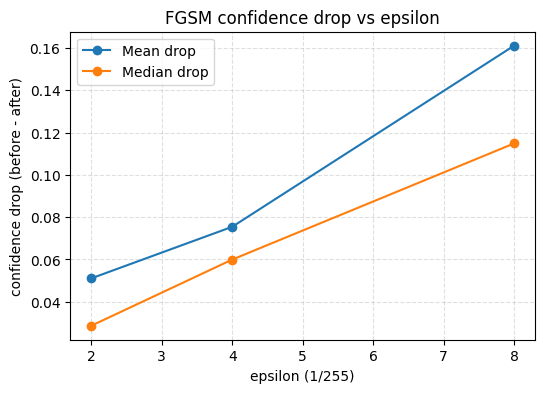

In [ ]:
# FGSM summary + graph
import os, pandas as pd, numpy as np, matplotlib.pyplot as plt

eps_list = [2, 4, 8]
csv_tpl = "/content/adv_bbox_eps{e}_orig/fgsm_bbox_summary_eps{e}.csv"

rows = []
for e in eps_list:
    p = csv_tpl.format(e=e)
    if not os.path.exists(p):
        print(f"[skip] CSV not found for eps={e}: {p}")
        continue
    df = pd.read_csv(p)
    df["drop"] = df["conf_before"] - df["conf_after"]
    df["lost"] = df["conf_after"] <= 1e-6  # detections that vanished
    rows.append({
        "epsilon": e,
        "mean_before": df["conf_before"].mean(),
        "mean_after":  df["conf_after"].mean(),
        "mean_drop":   df["drop"].mean(),
        "median_drop": df["drop"].median(),
        "num_lost":    int(df["lost"].sum()),
        "frac_lost":   float(df["lost"].mean()),
    })

if not rows:
    print("No CSVs found. Generate FGSM results first.")
else:
    summary = pd.DataFrame(rows).sort_values("epsilon")
    print(summary.to_string(index=False))

    plt.figure(figsize=(6,4))
    plt.plot(summary["epsilon"], summary["mean_drop"], marker="o", label="Mean drop")
    plt.plot(summary["epsilon"], summary["median_drop"], marker="o", label="Median drop")
    plt.title("FGSM confidence drop vs epsilon")
    plt.xlabel("epsilon (1/255)")
    plt.ylabel("confidence drop (before - after)")
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.legend()
    plt.show()


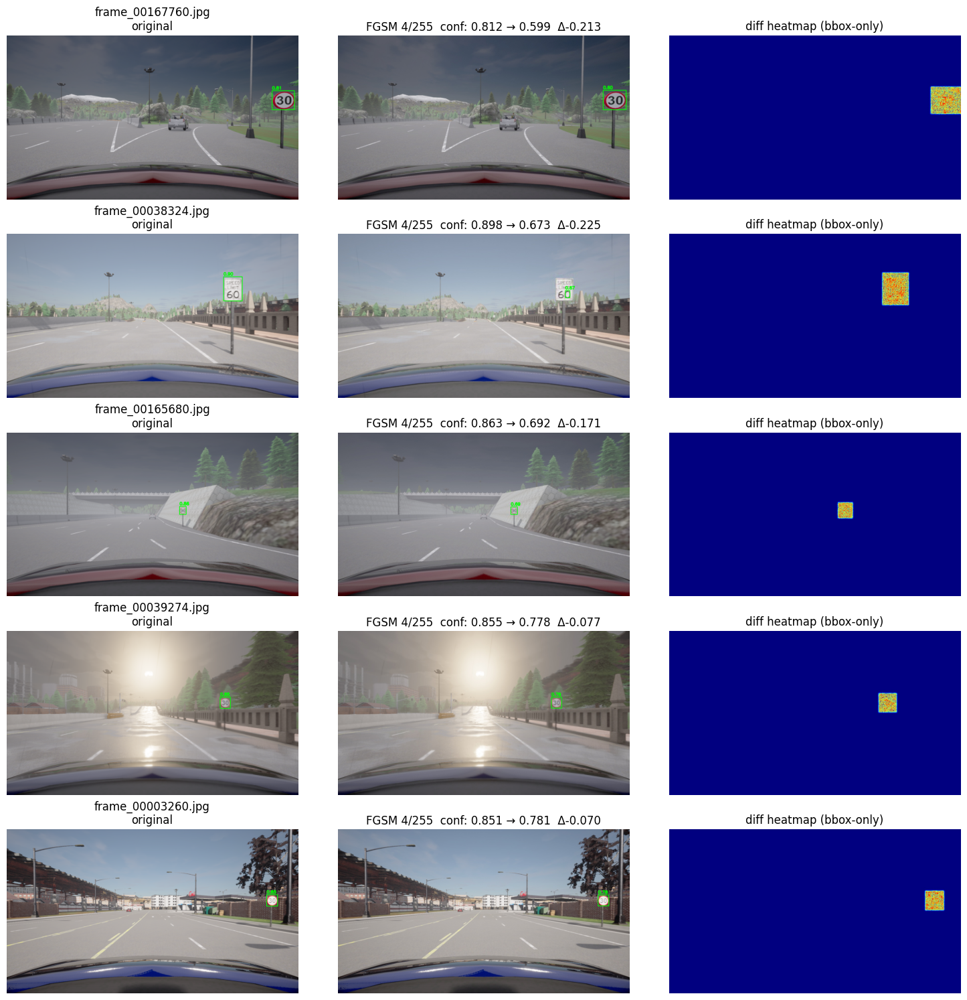

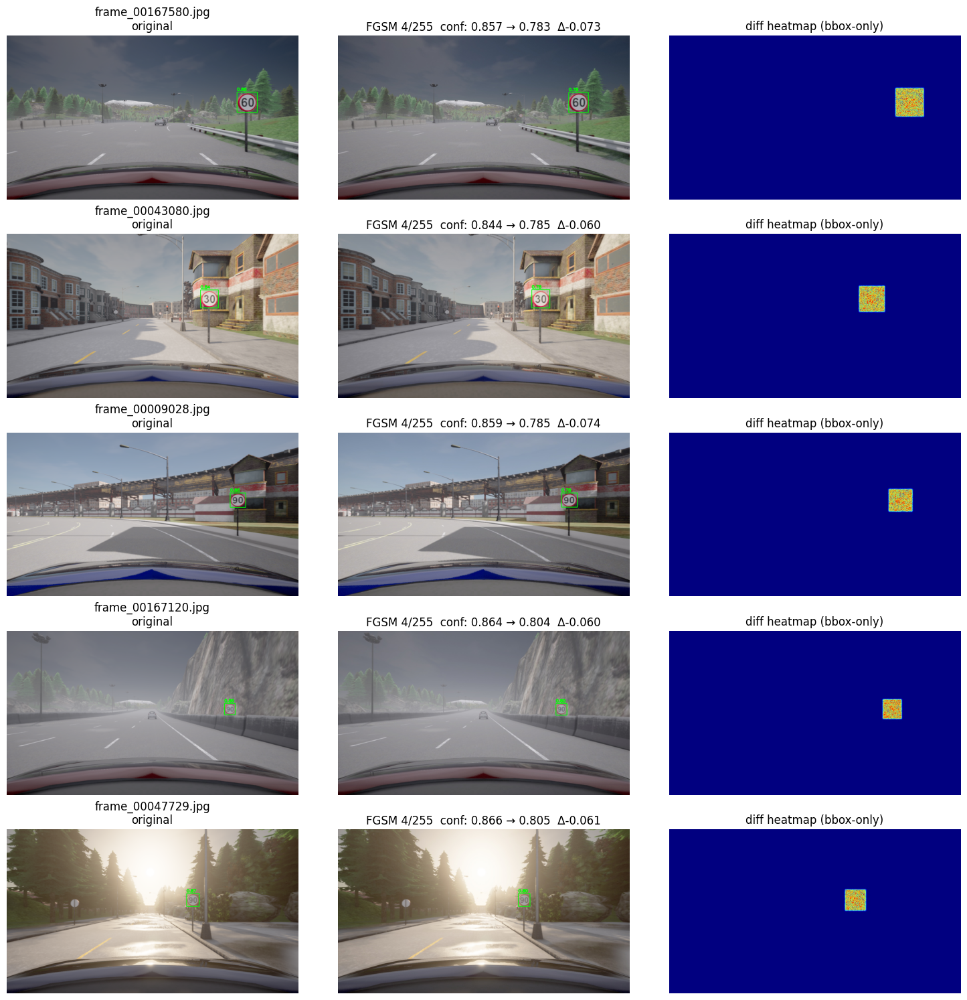

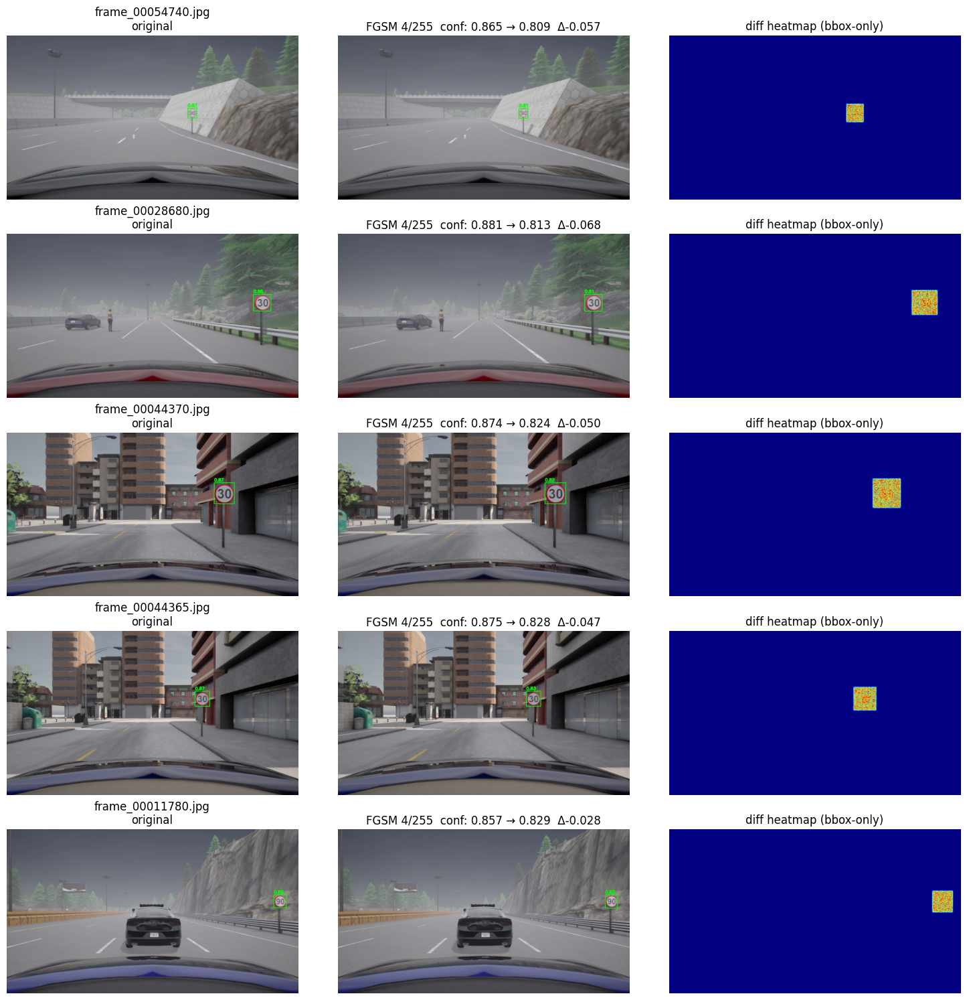

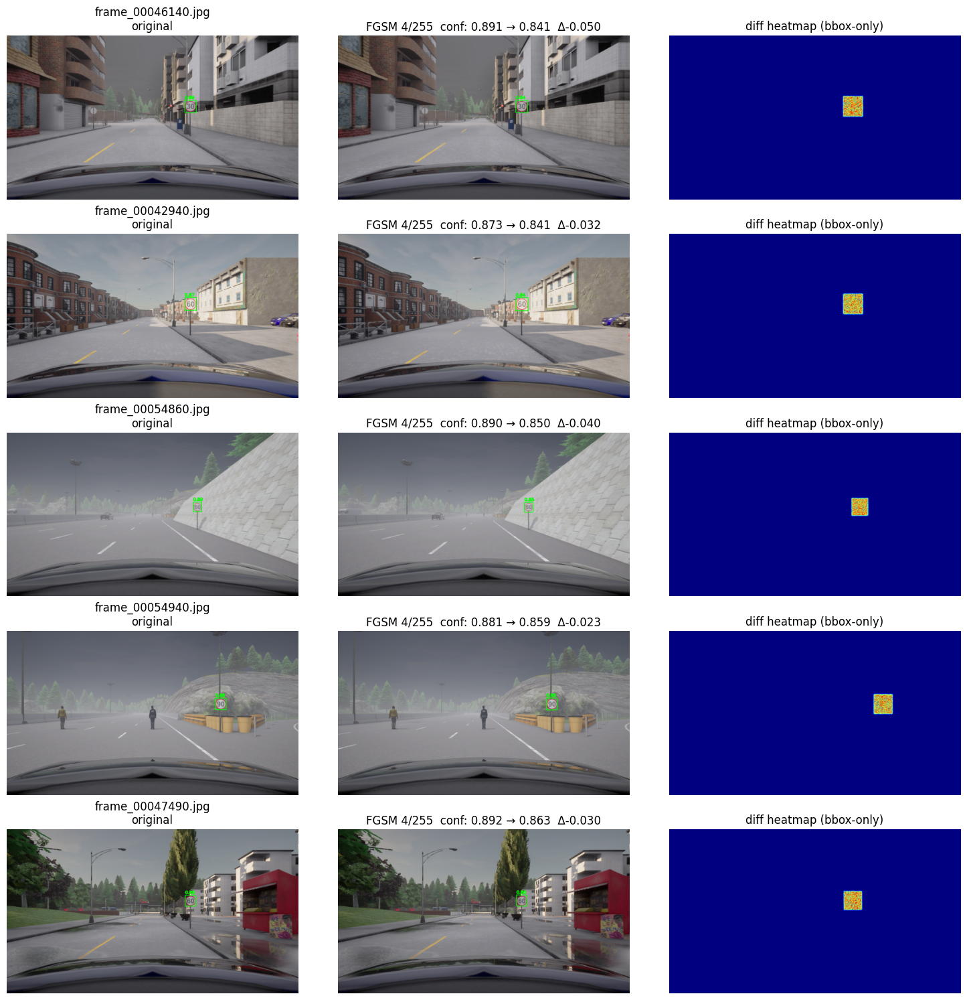

In [ ]:
# === Visualize ONLY FGSM 4/255 results (original, adv, heatmap) ===
import os, cv2, pandas as pd, matplotlib.pyplot as plt
from ultralytics import YOLO

EPS = 4  # 4/255
WEIGHTS  = "/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune/weights/best.pt"
SRC_DIR  = "/content/test_images/test"
ADV_DIR  = f"/content/adv_bbox_eps{EPS}_orig"
DIFF_DIR = f"/content/adv_bbox_eps{EPS}_diff"
CSV_PATH = os.path.join(ADV_DIR, f"fgsm_bbox_summary_eps{EPS}.csv")

df = pd.read_csv(CSV_PATH)
names = df["image"].tolist()
vals  = {r["image"]:(float(r["conf_before"]), float(r["conf_after"]), float(r["delta"]))
         for _, r in df.iterrows()}

# draw YOLO box for context
model = YOLO(WEIGHTS)
def draw_box(path):
    im = cv2.imread(path)
    r = model.predict(source=path, imgsz=896, conf=0.25, iou=0.5, max_det=1, verbose=False)[0]
    if len(r.boxes):
        x1,y1,x2,y2 = r.boxes.xyxy[0].cpu().numpy().astype(int).tolist()
        conf = float(r.boxes.conf[0].cpu())
        cv2.rectangle(im, (x1,y1), (x2,y2), (0,255,0), 2)
        cv2.putText(im, f"{conf:.2f}", (x1, max(0,y1-6)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2, cv2.LINE_AA)
    return im

# paginate (5 rows/page -> 3 columns: original | adv | heatmap)
per_page = 5
for i in range(0, len(names), per_page):
    batch = names[i:i+per_page]
    rows, cols = len(batch), 3
    fig = plt.figure(figsize=(cols*5, rows*3))

    for r_idx, name in enumerate(batch):
        cb, ca, dd = vals[name]
        orig = cv2.cvtColor(draw_box(os.path.join(SRC_DIR, name)), cv2.COLOR_BGR2RGB)
        adv  = cv2.cvtColor(draw_box(os.path.join(ADV_DIR, name)), cv2.COLOR_BGR2RGB)
        diff = cv2.cvtColor(cv2.imread(os.path.join(DIFF_DIR, name)), cv2.COLOR_BGR2RGB)

        ax = plt.subplot(rows, cols, r_idx*cols+1); ax.imshow(orig); ax.axis("off")
        ax.set_title(f"{name}\noriginal")

        ax = plt.subplot(rows, cols, r_idx*cols+2); ax.imshow(adv); ax.axis("off")
        ax.set_title(f"FGSM {EPS}/255  conf: {cb:.3f} → {ca:.3f}  Δ{dd:.3f}")

        ax = plt.subplot(rows, cols, r_idx*cols+3); ax.imshow(diff); ax.axis("off")
        ax.set_title("diff heatmap (bbox-only)")

    plt.tight_layout(); plt.show()


**PGD attack**

In [ ]:
# PGD (bbox-only, ℓ∞) mapped back to ORIGINAL image size + diff heatmaps
import os, glob, cv2, torch, numpy as np, pandas as pd
from ultralytics import YOLO

# --- paths ---
WEIGHTS = "/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune/weights/best.pt"
SOURCE  = "/content/test_images/test"

# --- attack params  ---
IMGSZ   = 896
CONF    = 0.25
IOU     = 0.5
EPS     = 8/255        # total budget (l-infinity)
ALPHA   = 2/255        # step size
STEPS   = 10           # number of iterations
RAND_START = True      # random start within epsilon ball
PAD_PX  = 12           # enlarge bbox slightly

# --- outputs ---
OUTDIR_IMG = f"/content/pgd_bbox_eps{int(EPS*255)}_orig"
OUTDIR_DIF = f"/content/pgd_bbox_eps{int(EPS*255)}_diff"
os.makedirs(OUTDIR_IMG, exist_ok=True)
os.makedirs(OUTDIR_DIF, exist_ok=True)

def letterbox(im, new_shape=IMGSZ, color=(114,114,114)):
    h, w = im.shape[:2]
    r = min(new_shape / h, new_shape / w)
    nh, nw = int(round(h * r)), int(round(w * r))
    im_resized = cv2.resize(im, (nw, nh), interpolation=cv2.INTER_LINEAR)
    top = (new_shape - nh) // 2
    bottom = new_shape - nh - top
    left = (new_shape - nw) // 2
    right = new_shape - nw - left
    im_padded = cv2.copyMakeBorder(im_resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
    return im_padded, r, (left, top), (nh, nw)

def mask_from_xyxy(x1,y1,x2,y2,H,W,pad=0):
    x1 = max(0, int(np.floor(x1 - pad))); y1 = max(0, int(np.floor(y1 - pad)))
    x2 = min(W, int(np.ceil (x2 + pad))); y2 = min(H, int(np.ceil (y2 + pad)))
    M = np.zeros((H, W), dtype=np.float32)
    M[y1:y2, x1:x2] = 1.0
    M = cv2.GaussianBlur(M, (7,7), 0)
    return M[..., None]

def collect_tensors(x):
    if torch.is_tensor(x): return [x]
    out = []
    if isinstance(x,(list,tuple)):
        for it in x: out.extend(collect_tensors(it))
    return out

def tensor_to_BNC(t):
    if t.dim()==5: B,A,H,W,C = t.shape; return t.permute(0,2,3,1,4).contiguous().view(B, H*W*A, C)
    if t.dim()==4: B,C,H,W = t.shape;  return t.permute(0,2,3,1).contiguous().view(B, H*W, C)
    if t.dim()==3: return t
    B = t.shape[0]; return t.view(B, -1, t.shape[-1])

def confidence_proxy_from_raw(raw):
    """
    Differentiable proxy for confidence: mean(sigmoid(obj) * max(sigmoid(cls))).
    Aggregates over all detect parts; version-proof.
    """
    parts = collect_tensors(raw)
    scalars = []
    for t in parts:
        T = tensor_to_BNC(t)
        C = T.shape[-1]
        if C < 5:
            continue
        obj = torch.sigmoid(T[..., 4])
        if C > 5:
            cls = torch.sigmoid(T[..., 5:])
            cls = cls.max(dim=-1).values if cls.shape[-1] > 1 else cls[..., 0]
        else:
            cls = torch.ones_like(obj)
        scalars.append((obj * cls).mean())
    if not scalars:
        T = tensor_to_BNC(parts[-1])
        return torch.sigmoid(T[..., -1]).mean()
    return sum(scalars) / len(scalars)

def conf_one(det_model, path, imgsz=IMGSZ, conf=CONF, iou=IOU):
    r = det_model.predict(source=path, imgsz=imgsz, conf=conf, iou=iou, max_det=1, verbose=False)[0]
    return float(r.boxes.conf.max().cpu()) if len(r.boxes) else 0.0

# ---------- models ----------
det = YOLO(WEIGHTS)           # predictor (NMS) for measuring conf
net = YOLO(WEIGHTS).model     # raw model for gradients
device = next(net.parameters()).device
net.eval()

rows = []
imgs = sorted(glob.glob(os.path.join(SOURCE, "*")))
assert imgs, f"No images in {SOURCE}"

for img_path in imgs:
    name = os.path.basename(img_path)

    # (A) baseline: top bbox & conf on original image
    r0 = det.predict(source=img_path, imgsz=IMGSZ, conf=CONF, iou=IOU, max_det=1, verbose=False)[0]
    if len(r0.boxes) == 0:
        rows.append({"image": name, "conf_before": 0.0, "conf_after": 0.0, "delta": 0.0})
        continue
    conf_before = float(r0.boxes.conf.max().cpu())
    x1o,y1o,x2o,y2o = r0.boxes.xyxy[0].cpu().numpy().tolist()

    # (B) letterbox + bbox mask on square canvas
    im0_bgr = cv2.imread(img_path); im0_rgb = im0_bgr[:, :, ::-1]
    H0, W0 = im0_rgb.shape[:2]
    im_sq, r, (px,py), (nh,nw) = letterbox(im0_rgb, IMGSZ)
    H, W = IMGSZ, IMGSZ
    x1 = x1o * r + px; y1 = y1o * r + py
    x2 = x2o * r + px; y2 = y2o * r + py

    mask_sq = mask_from_xyxy(x1,y1,x2,y2, H,W, pad=PAD_PX)
    img_sq  = im_sq.astype(np.float32)/255.0
    img     = torch.from_numpy(img_sq).permute(2,0,1).unsqueeze(0).to(device)    # [1,3,H,W]
    mask    = torch.from_numpy(mask_sq).permute(2,0,1).unsqueeze(0).to(device)   # [1,1,H,W]

    # (C) initialize delta (PGD variable), restricted to bbox mask
    if RAND_START:
        delta = (torch.empty_like(img).uniform_(-EPS, EPS)) * mask
    else:
        delta = torch.zeros_like(img)
    adv = (img + delta).clamp(0,1).detach()

    # (D) PGD loop to MINIMIZE confidence proxy
    for _ in range(STEPS):
        adv.requires_grad_(True)
        raw = net(adv)
        conf_proxy = confidence_proxy_from_raw(raw)  # scalar

        # ascent on (-conf) == descent on conf
        conf_proxy.backward()
        with torch.no_grad():
            grad_sign = adv.grad.sign()
            delta = (delta - ALPHA * grad_sign * mask).clamp(-EPS, EPS)
            delta = delta * mask
            adv = (img + delta).clamp(0,1)
        adv = adv.detach()

    # (E) map ONLY the perturbation back to original size
    base_sq   = img.cpu().numpy()[0].transpose(1,2,0)           # RGB
    adv_sq    = adv.cpu().numpy()[0].transpose(1,2,0)           # RGB
    delta_sq  = (adv_sq - base_sq) * mask_sq                    # restrict (safety)
    delta_crop = delta_sq[py:py+nh, px:px+nw, :]
    delta_orig = cv2.resize(delta_crop, (W0, H0), interpolation=cv2.INTER_LINEAR)

    adv_orig = np.clip(im0_rgb/255.0 + delta_orig, 0, 1)
    adv_orig_bgr = (adv_orig[..., ::-1]*255).astype(np.uint8)

    # diff heatmap for visualization
    diff = np.abs(delta_orig).mean(axis=2)
    heat = (np.clip(diff/(EPS*1.2), 0, 1) * 255).astype(np.uint8)
    heat = cv2.applyColorMap(heat, cv2.COLORMAP_JET)

    # save
    adv_path  = os.path.join(OUTDIR_IMG, name)
    diff_path = os.path.join(OUTDIR_DIF, name)
    cv2.imwrite(adv_path,  adv_orig_bgr)
    cv2.imwrite(diff_path, heat)

    # (F) measure after-attack confidence with the normal predictor
    conf_after = conf_one(det, adv_path)
    rows.append({"image": name, "conf_before": conf_before, "conf_after": conf_after, "delta": conf_after - conf_before})

# (G) summary CSV
df = pd.DataFrame(rows).sort_values("conf_after").reset_index(drop=True)
csv_path = os.path.join(OUTDIR_IMG, f"pgd_bbox_summary_eps{int(EPS*255)}_a{int(ALPHA*255)}_k{STEPS}.csv")
df.to_csv(csv_path, index=False)

print("Adversarial images (original size) →", OUTDIR_IMG)
print("Diff heatmaps →", OUTDIR_DIF)
print("CSV →", csv_path)
print(df.to_string(index=False))


Adversarial images (original size) → /content/pgd_bbox_eps8_orig
Diff heatmaps → /content/pgd_bbox_eps8_diff
CSV → /content/pgd_bbox_eps8_orig/pgd_bbox_summary_eps8_a2_k10.csv
             image  conf_before  conf_after     delta
frame_00028680.jpg     0.880561    0.000000 -0.880561
frame_00042940.jpg     0.872882    0.000000 -0.872882
frame_00039274.jpg     0.854616    0.000000 -0.854616
frame_00038324.jpg     0.898417    0.000000 -0.898417
frame_00047729.jpg     0.866293    0.000000 -0.866293
frame_00054740.jpg     0.865427    0.000000 -0.865427
frame_00054860.jpg     0.890467    0.000000 -0.890467
frame_00044365.jpg     0.874971    0.000000 -0.874971
frame_00167120.jpg     0.864086    0.000000 -0.864086
frame_00165680.jpg     0.862591    0.000000 -0.862591
frame_00047490.jpg     0.892148    0.260546 -0.631601
frame_00167760.jpg     0.812473    0.288161 -0.524313
frame_00009028.jpg     0.858524    0.299437 -0.559087
frame_00044370.jpg     0.874040    0.328835 -0.545205
frame_00003260

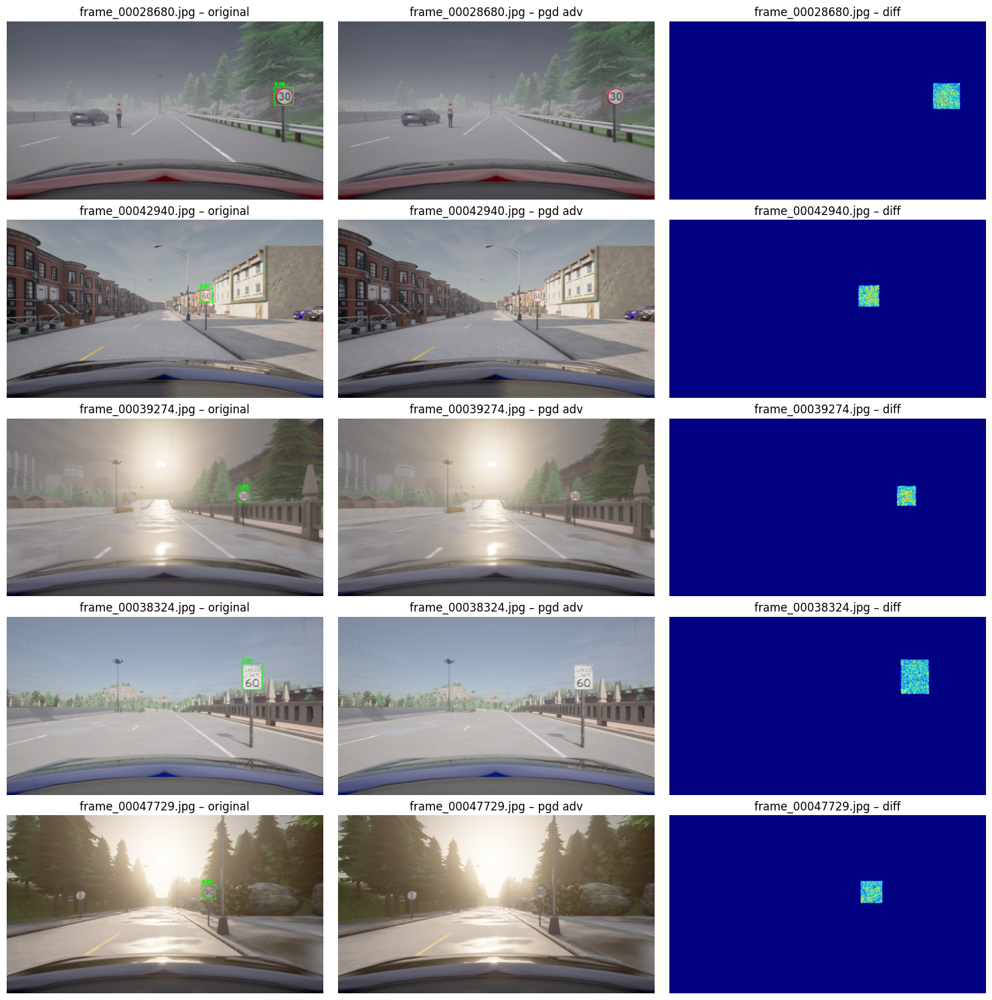

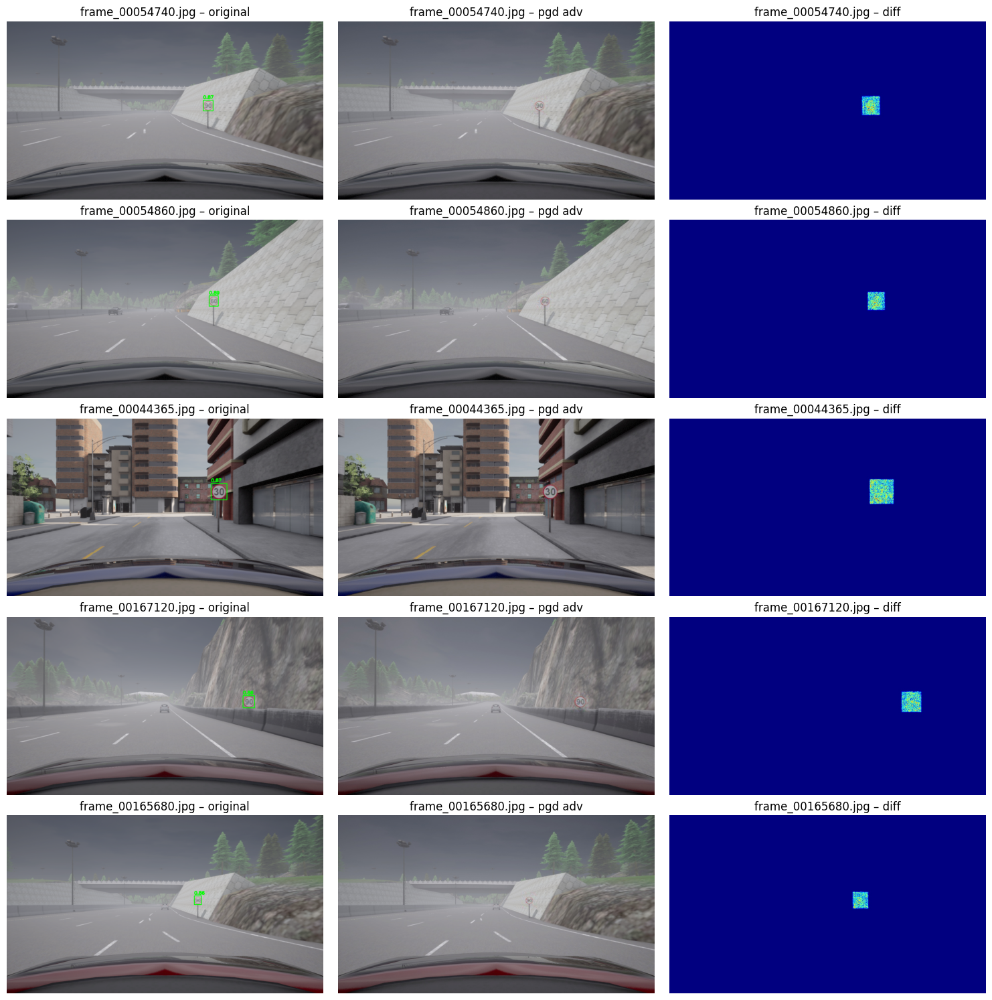

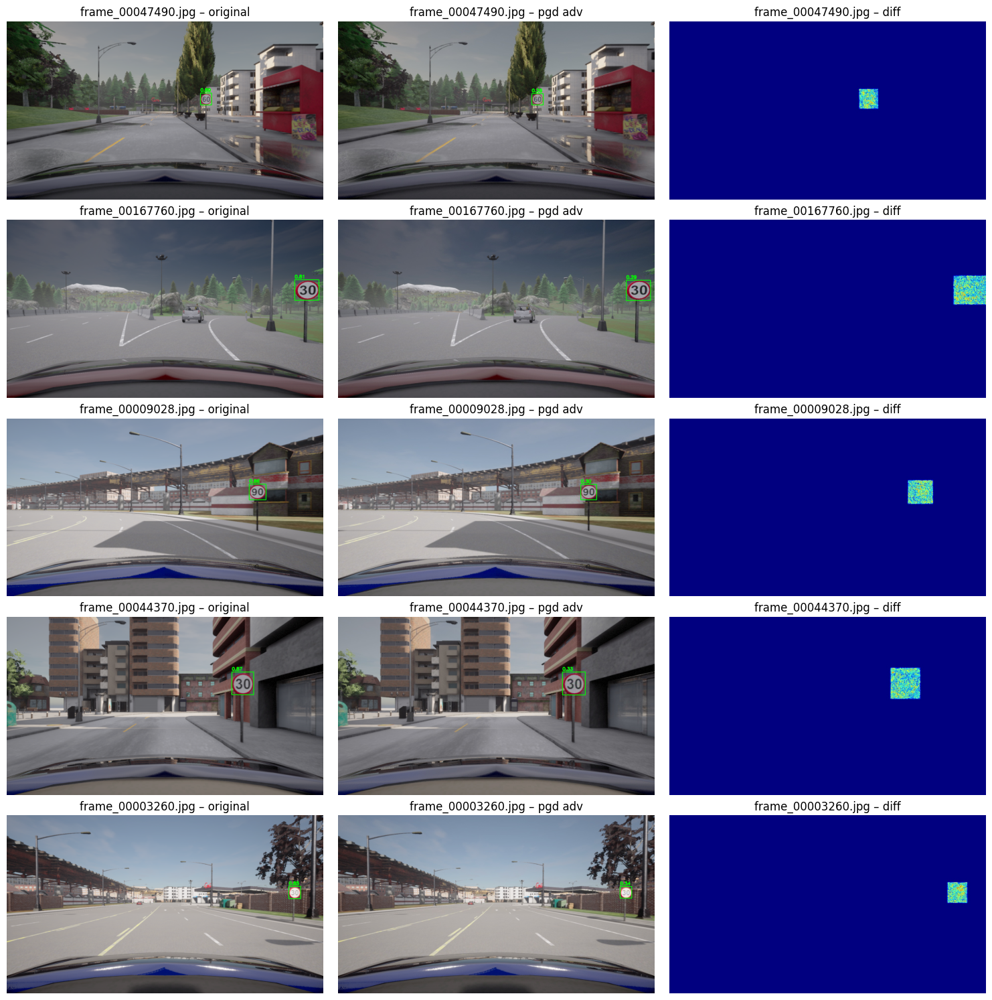

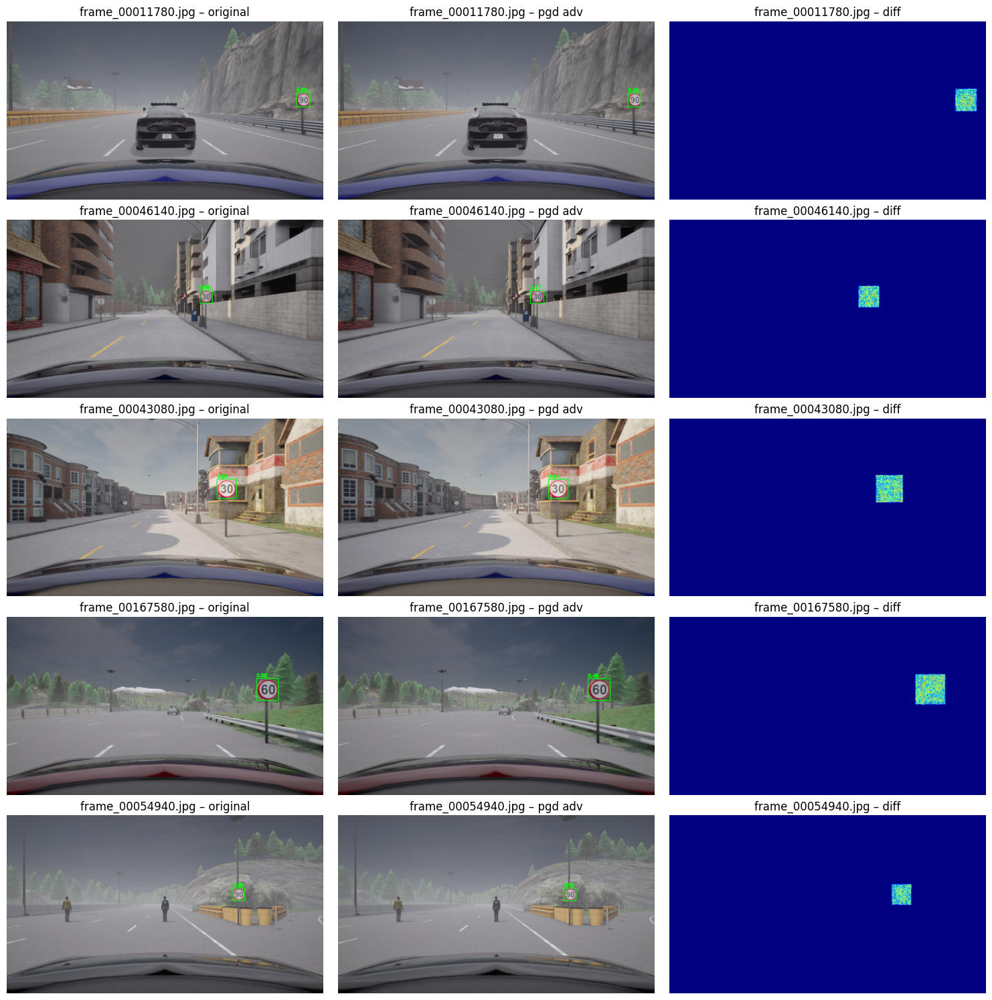

In [ ]:
# Visual check: original vs PGD-adversarial vs diff heatmap
import os, cv2, pandas as pd, numpy as np, matplotlib.pyplot as plt
from ultralytics import YOLO

WEIGHTS  = "/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune/weights/best.pt"
SRC_DIR  = "/content/test_images/test"
ADV_DIR  = "/content/pgd_bbox_eps8_orig"
DIFF_DIR = "/content/pgd_bbox_eps8_diff"
CSV_PATH = os.path.join(ADV_DIR, "pgd_bbox_summary_eps8_a2_k10.csv")

model = YOLO(WEIGHTS)
df = pd.read_csv(CSV_PATH)
names = df["image"].tolist()
def draw_top(path):
    im = cv2.imread(path)
    r = model.predict(path, imgsz=896, conf=0.25, iou=0.5, max_det=1, verbose=False)[0]
    if len(r.boxes):
        x1,y1,x2,y2 = r.boxes.xyxy[0].cpu().numpy().astype(int).tolist()
        c = float(r.boxes.conf[0].cpu()); cv2.rectangle(im,(x1,y1),(x2,y2),(0,255,0),2)
        cv2.putText(im,f"{c:.2f}",(x1,max(0,y1-6)),cv2.FONT_HERSHEY_SIMPLEX,0.6,(0,255,0),2,cv2.LINE_AA)
    return im
cols=3; rows=(len(names)+4)//5
for i in range(0,len(names),5):
    batch=names[i:i+5]; plt.figure(figsize=(15,3*len(batch)))
    for r,name in enumerate(batch):
        o=draw_top(os.path.join(SRC_DIR,name)); a=draw_top(os.path.join(ADV_DIR,name)); d=cv2.imread(os.path.join(DIFF_DIR,name))
        for j,img,title in [(1,o,"original"),(2,a,"pgd adv"),(3,d,"diff")]:
            ax=plt.subplot(len(batch),3,r*3+j); ax.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB)); ax.axis("off"); ax.set_title(f"{name} – {title}")
    plt.tight_layout(); plt.show()


**DEFENSE** **STRATEGIES**

In [ ]:
# Evaluate bbox-only defenses on FGSM 4/255 images and measure confidence recovery
import os, glob, cv2, numpy as np, pandas as pd
from ultralytics import YOLO

WEIGHTS   = "/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune/weights/best.pt"
SOURCE    = "/content/adv_bbox_eps4_orig"
OUT_BASE  = "/content/defense_on_fgsm4"
IMGSZ, CONF, IOU = 896, 0.25, 0.5

os.makedirs(OUT_BASE, exist_ok=True)
det = YOLO(WEIGHTS)

def top_conf_and_bbox(model, path):
    r = model.predict(source=path, imgsz=IMGSZ, conf=CONF, iou=IOU, max_det=1, verbose=False)[0]
    if len(r.boxes):
        x1,y1,x2,y2 = r.boxes.xyxy[0].cpu().numpy().astype(int).tolist()
        return float(r.boxes.conf[0].cpu()), (x1,y1,x2,y2)
    return 0.0, None

def defend_roi(img, box, kind):
    if box is None:
        roi = img; y1=x1=0; y2,x2=img.shape[0], img.shape[1]
    else:
        x1,y1,x2,y2 = box; roi = img[y1:y2, x1:x2]

    if kind == "gaussian7_1.2":
        out_roi = cv2.GaussianBlur(roi, (7,7), 1.2)
    elif kind == "median3":
        out_roi = cv2.medianBlur(roi, 3)
    elif kind == "bilateral":
        out_roi = cv2.bilateralFilter(roi, d=9, sigmaColor=75, sigmaSpace=75)
    elif kind == "jpeg70":
        enc = cv2.imencode(".jpg", roi, [cv2.IMWRITE_JPEG_QUALITY, 70])[1]
        out_roi = cv2.imdecode(enc, cv2.IMREAD_COLOR)
    else:
        out_roi = roi

    out = img.copy()
    if box is None:
        out = out_roi
    else:
        out[y1:y2, x1:x2] = out_roi
    return out

defenses = ["gaussian7_1.2", "median3", "bilateral", "jpeg70"]
images = sorted([p for p in glob.glob(os.path.join(SOURCE, "*"))
                 if os.path.splitext(p)[1].lower() in {".jpg",".jpeg",".png",".bmp",".webp"}])
assert images, f"No images in {SOURCE}"

summary_rows = []
for kind in defenses:
    out_dir = os.path.join(OUT_BASE, kind)
    os.makedirs(out_dir, exist_ok=True)
    rows = []
    for p in images:
        name = os.path.basename(p)
        conf_before, box = top_conf_and_bbox(det, p)  # FGSM confidence & bbox
        img = cv2.imread(p)

        defended = defend_roi(img, box, kind)
        out_path = os.path.join(out_dir, name)
        cv2.imwrite(out_path, defended)

        conf_after, _ = top_conf_and_bbox(det, out_path)
        rows.append({"image": name, "conf_before": conf_before,
                     "conf_after": conf_after, "delta": conf_after - conf_before})

    df = pd.DataFrame(rows).sort_values("delta", ascending=False)
    csv_path = os.path.join(out_dir, f"{kind}.csv")
    df.to_csv(csv_path, index=False)

    mean_gain = df["delta"].mean()
    improved = int((df["delta"] > 0).sum())
    summary_rows.append({"defense": kind, "mean_gain": mean_gain, "n_improved": improved})
    print(f"{kind}: mean Δ={mean_gain:.4f}  improved {improved}/{len(df)}  → {csv_path}")

summary = pd.DataFrame(summary_rows).sort_values("mean_gain", ascending=False)
print("\n== Defense ranking (higher mean_gain is better) ==")
print(summary.to_string(index=False))
print(f"\nDefended images saved under: {OUT_BASE}")


gaussian7_1.2: mean Δ=-0.0061  improved 16/20  → /content/defense_on_fgsm4/gaussian7_1.2/gaussian7_1.2.csv
median3: mean Δ=0.0046  improved 18/20  → /content/defense_on_fgsm4/median3/median3.csv
bilateral: mean Δ=0.0134  improved 17/20  → /content/defense_on_fgsm4/bilateral/bilateral.csv
jpeg70: mean Δ=0.0098  improved 19/20  → /content/defense_on_fgsm4/jpeg70/jpeg70.csv

== Defense ranking (higher mean_gain is better) ==
      defense  mean_gain  n_improved
    bilateral   0.013419          17
       jpeg70   0.009766          19
      median3   0.004582          18
gaussian7_1.2  -0.006119          16

Defended images saved under: /content/defense_on_fgsm4


      defense  mean_gain  improved
    bilateral   0.013419        17
       jpeg70   0.009766        19
      median3   0.004582        18
gaussian7_1.2  -0.006119        16


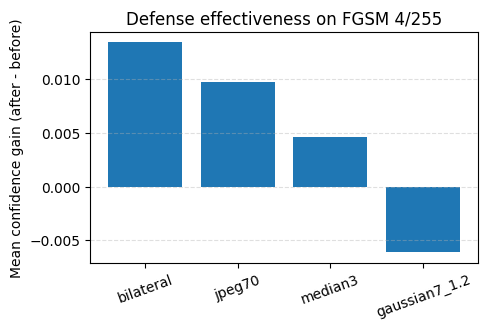

In [ ]:
import pandas as pd, os, matplotlib.pyplot as plt

base = "/content/defense_on_fgsm4"
files = {
    "bilateral":  f"{base}/bilateral/bilateral.csv",
    "jpeg70":     f"{base}/jpeg70/jpeg70.csv",
    "median3":    f"{base}/median3/median3.csv",
    "gaussian7_1.2": f"{base}/gaussian7_1.2/gaussian7_1.2.csv",
}

rows = []
for name, path in files.items():
    df = pd.read_csv(path)
    rows.append({"defense": name, "mean_gain": (df["conf_after"]-df["conf_before"]).mean(),
                 "improved": int((df["conf_after"] > df["conf_before"]).sum())})
summary = pd.DataFrame(rows).sort_values("mean_gain", ascending=False)
print(summary.to_string(index=False))

plt.figure(figsize=(5,3))
plt.bar(summary["defense"], summary["mean_gain"])
plt.ylabel("Mean confidence gain (after - before)")
plt.title("Defense effectiveness on FGSM 4/255")
plt.xticks(rotation=20)
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.show()


**JPEG ON FGSM**

In [ ]:
# --- JPEG defense on FGSM 4/255 images ---
import os, glob, cv2, pandas as pd
from ultralytics import YOLO

# paths + settings
WEIGHTS = "/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune/weights/best.pt"
SOURCE_ADV = "/content/adv_bbox_eps4_orig"        # FGSM 4/255 outputs (original-size images)
OUTDIR     = "/content/defense_on_fgsm4/jpeg70"   # where defended images + CSV will save
IMGSZ, CONF, IOU = 896, 0.25, 0.5
JPEG_QUALITY = 70

os.makedirs(OUTDIR, exist_ok=True)

# model for confidence queries
det = YOLO(WEIGHTS)

def conf_one(det_model, path):
    r = det_model.predict(source=path, imgsz=IMGSZ, conf=CONF, iou=IOU, max_det=1, verbose=False)[0]
    return float(r.boxes.conf.max().cpu()) if len(r.boxes) else 0.0

def jpeg_defense(in_path, out_path, q=70):
    im = cv2.imread(in_path)  # BGR
    ok, buf = cv2.imencode(".jpg", im, [cv2.IMWRITE_JPEG_QUALITY, q])
    im_def = cv2.imdecode(buf, cv2.IMREAD_COLOR)
    cv2.imwrite(out_path, im_def)

rows = []
imgs = sorted([p for ext in ("*.jpg","*.jpeg","*.png","*.bmp","*.webp")
               for p in glob.glob(os.path.join(SOURCE_ADV, ext))])
assert imgs, f"No images found in {SOURCE_ADV}"

for p in imgs:
    name = os.path.basename(p)
    outp = os.path.join(OUTDIR, name)

    # confidence on adversarial image (before defense)
    cb = conf_one(det, p)

    # apply JPEG defense and save
    jpeg_defense(p, outp, JPEG_QUALITY)

    # confidence after defense
    ca = conf_one(det, outp)

    rows.append({"image": name, "conf_before": cb, "conf_after": ca, "delta": ca - cb})

df = pd.DataFrame(rows).sort_values("delta")
csv_path = os.path.join(OUTDIR, "jpeg70_on_fgsm4_summary.csv")
df.to_csv(csv_path, index=False)

print(f"Defended images → {OUTDIR}")
print(f"CSV → {csv_path}")
print(df.to_string(index=False))

print("\nImproved:", (df['delta']>0).sum(), "/", len(df),
      " | mean Δ:", df['delta'].mean())


Defended images → /content/defense_on_fgsm4/jpeg70
CSV → /content/defense_on_fgsm4/jpeg70/jpeg70_on_fgsm4_summary.csv
             image  conf_before  conf_after     delta
frame_00165680.jpg     0.692060    0.664135 -0.027924
frame_00038324.jpg     0.673003    0.669312 -0.003691
frame_00054940.jpg     0.858569    0.861476  0.002907
frame_00042940.jpg     0.841117    0.846691  0.005574
frame_00047490.jpg     0.862531    0.870035  0.007503
frame_00054860.jpg     0.850274    0.858439  0.008164
frame_00046140.jpg     0.840649    0.851748  0.011099
frame_00044370.jpg     0.823855    0.836911  0.013056
frame_00011780.jpg     0.829069    0.842418  0.013349
frame_00043080.jpg     0.784654    0.798991  0.014337
frame_00047729.jpg     0.804989    0.820985  0.015996
frame_00044365.jpg     0.827710    0.844849  0.017139
frame_00167580.jpg     0.783131    0.800776  0.017645
frame_00003260.jpg     0.780981    0.798913  0.017932
frame_00167120.jpg     0.804044    0.824441  0.020396
frame_00054740.jpg

             image  conf_before  conf_after     delta
frame_00165680.jpg     0.692060    0.664135 -0.027924
frame_00038324.jpg     0.673003    0.669312 -0.003691
frame_00054940.jpg     0.858569    0.861476  0.002907
frame_00042940.jpg     0.841117    0.846691  0.005574
frame_00047490.jpg     0.862531    0.870035  0.007503
frame_00054860.jpg     0.850274    0.858439  0.008164
frame_00046140.jpg     0.840649    0.851748  0.011099
frame_00044370.jpg     0.823855    0.836911  0.013056
frame_00011780.jpg     0.829069    0.842418  0.013349
frame_00043080.jpg     0.784654    0.798991  0.014337
frame_00047729.jpg     0.804989    0.820985  0.015996
frame_00044365.jpg     0.827710    0.844849  0.017139
frame_00167580.jpg     0.783131    0.800776  0.017645
frame_00003260.jpg     0.780981    0.798913  0.017932
frame_00167120.jpg     0.804044    0.824441  0.020396
frame_00054740.jpg     0.808840    0.831908  0.023069
frame_00028680.jpg     0.812889    0.837354  0.024465
frame_00167760.jpg     0.599

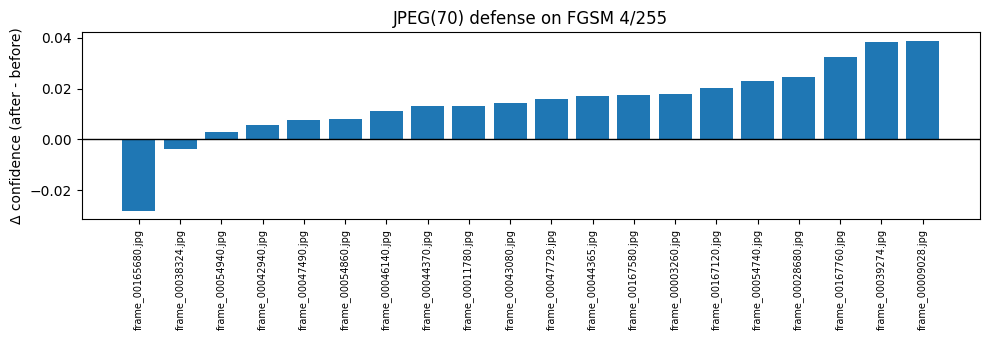

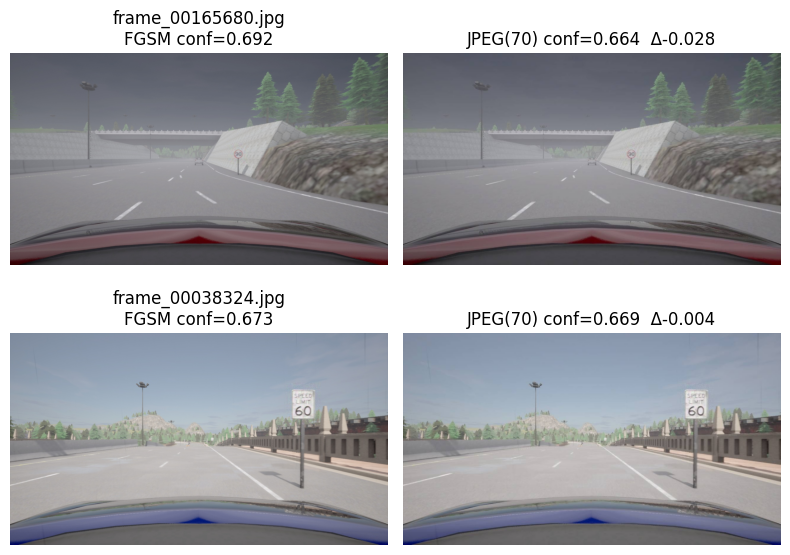

In [ ]:
import os, cv2, pandas as pd, matplotlib.pyplot as plt

CSV   = "/content/defense_on_fgsm4/jpeg70/jpeg70_on_fgsm4_summary.csv"
ADV   = "/content/adv_bbox_eps4_orig"                 # FGSM 4/255 inputs
DEF   = "/content/defense_on_fgsm4/jpeg70"            # JPEG70 outputs

df = pd.read_csv(CSV).sort_values("delta")
print(df.to_string(index=False))

# --- bar plot of per-image deltas ---
plt.figure(figsize=(10,3.5))
plt.bar(range(len(df)), df["delta"])
plt.axhline(0, color="k", lw=1)
plt.xticks(range(len(df)), df["image"], rotation=90, fontsize=7)
plt.ylabel("Δ confidence (after - before)")
plt.title("JPEG(70) defense on FGSM 4/255")
plt.tight_layout(); plt.show()

# --- show the two worst (if any) ---
worst = df.nsmallest(2, "delta")
fig, axes = plt.subplots(len(worst), 2, figsize=(8, 3*len(worst)))
if len(worst) == 1: axes = [axes]  # normalize shape

for axrow, (_, r) in zip(axes, worst.iterrows()):
    name = r["image"]
    adv  = cv2.cvtColor(cv2.imread(os.path.join(ADV, name)), cv2.COLOR_BGR2RGB)
    dfd  = cv2.cvtColor(cv2.imread(os.path.join(DEF, name)), cv2.COLOR_BGR2RGB)
    axrow[0].imshow(adv); axrow[0].axis("off")
    axrow[0].set_title(f"{name}\nFGSM conf={r['conf_before']:.3f}")
    axrow[1].imshow(dfd); axrow[1].axis("off")
    axrow[1].set_title(f"JPEG(70) conf={r['conf_after']:.3f}  Δ{r['delta']:.3f}")
plt.tight_layout(); plt.show()


**Bilateral defense on FGSM**

In [ ]:
# Bilateral defense on FGSM 4/255 (ROI-only by default)
import os, glob, cv2, numpy as np, pandas as pd
from ultralytics import YOLO

# === paths & params ===
WEIGHTS   = "/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune/weights/best.pt"
ADV_DIR   = "/content/adv_bbox_eps4_orig"           # <-- FGSM 4/255 outputs (original-size)
OUT_DIR   = "/content/defense_on_fgsm4/bilateral"   # defended images will go here
IMGSZ, CONF, IOU = 896, 0.25, 0.5

# bilateral filter hyperparams
D, SIGMA_COLOR, SIGMA_SPACE = 9, 60, 60
ROI_ONLY, PAD = True, 12   # set ROI_ONLY=False to filter whole image

os.makedirs(OUT_DIR, exist_ok=True)


det = YOLO(WEIGHTS)

def predict_one(path):
    r = det.predict(source=path, imgsz=IMGSZ, conf=CONF, iou=IOU, max_det=1, verbose=False)[0]
    if len(r.boxes):
        b = r.boxes
        conf = float(b.conf[0].cpu())
        x1,y1,x2,y2 = b.xyxy[0].cpu().numpy().astype(int).tolist()
        return conf, (x1,y1,x2,y2)
    else:
        return 0.0, None

rows = []
imgs = sorted([p for p in glob.glob(os.path.join(ADV_DIR, "*")) if p.lower().endswith((".jpg",".jpeg",".png",".bmp",".webp"))])

for p in imgs:
    name = os.path.basename(p)
    conf_before, box = predict_one(p)

    img = cv2.imread(p)
    if img is None:
        continue

    if ROI_ONLY and box is not None:
        x1,y1,x2,y2 = box
        x1 = max(0, x1-PAD); y1 = max(0, y1-PAD)
        x2 = min(img.shape[1], x2+PAD); y2 = min(img.shape[0], y2+PAD)
        roi = img[y1:y2, x1:x2]
        filtered = cv2.bilateralFilter(roi, d=D, sigmaColor=SIGMA_COLOR, sigmaSpace=SIGMA_SPACE)
        img_def = img.copy()
        img_def[y1:y2, x1:x2] = filtered
    else:
        img_def = cv2.bilateralFilter(img, d=D, sigmaColor=SIGMA_COLOR, sigmaSpace=SIGMA_SPACE)

    out_path = os.path.join(OUT_DIR, name)
    cv2.imwrite(out_path, img_def)

    conf_after, _ = predict_one(out_path)
    rows.append({"image": name, "conf_before": conf_before, "conf_after": conf_after, "delta": conf_after - conf_before})

# save & summarize
df = pd.DataFrame(rows).sort_values("delta")
csv_path = os.path.join(OUT_DIR, "bilateral_on_fgsm4_summary.csv")
df.to_csv(csv_path, index=False)

improved = (df["delta"] > 0).sum()
print(f"Defended images → {OUT_DIR}")
print(f"CSV → {csv_path}")
print(df.to_string(index=False))
print(f"\nImproved: {improved} / {len(df)}  | mean Δ: {df['delta'].mean():.6f}")


Defended images → /content/defense_on_fgsm4/bilateral
CSV → /content/defense_on_fgsm4/bilateral/bilateral_on_fgsm4_summary.csv
             image  conf_before  conf_after     delta
frame_00038324.jpg     0.673003    0.565834 -0.107169
frame_00047490.jpg     0.862531    0.864284  0.001753
frame_00046140.jpg     0.840649    0.849148  0.008500
frame_00054940.jpg     0.858569    0.873040  0.014471
frame_00011780.jpg     0.829069    0.844434  0.015365
frame_00042940.jpg     0.841117    0.856852  0.015735
frame_00047729.jpg     0.804989    0.824651  0.019662
frame_00044370.jpg     0.823855    0.844119  0.020265
frame_00044365.jpg     0.827710    0.848797  0.021088
frame_00043080.jpg     0.784654    0.808424  0.023770
frame_00167120.jpg     0.804044    0.828018  0.023974
frame_00054860.jpg     0.850274    0.874805  0.024531
frame_00028680.jpg     0.812889    0.839560  0.026671
frame_00003260.jpg     0.780981    0.807741  0.026760
frame_00039274.jpg     0.777755    0.811641  0.033885
frame_000

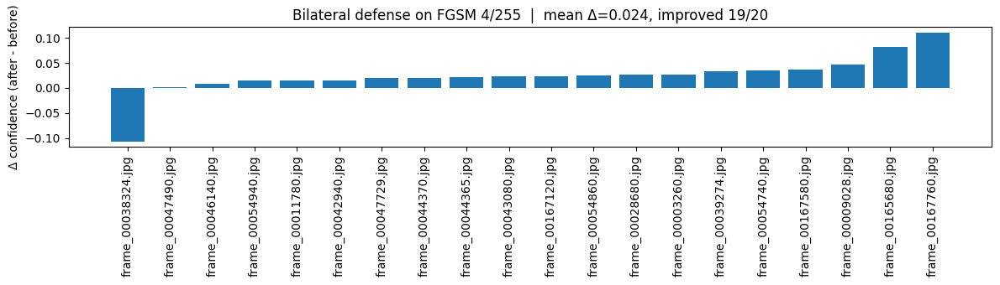

Saved figure to: /content/defense_on_fgsm4/bilateral/bilateral_bar.png


In [ ]:
import os, pandas as pd, matplotlib.pyplot as plt

CSV_BIL  = "/content/defense_on_fgsm4/bilateral/bilateral_on_fgsm4_summary.csv"
OUT_PNG  = "/content/defense_on_fgsm4/bilateral/bilateral_bar.png"

df = pd.read_csv(CSV_BIL)

# sort by improvement (after - before)
df = df.sort_values("delta")

mean_gain = df["delta"].mean()
n_improved = (df["delta"] > 0).sum()

plt.figure(figsize=(12,3.5))
plt.bar(df["image"], df["delta"])
plt.title(f"Bilateral defense on FGSM 4/255  |  mean Δ={mean_gain:.3f}, improved {n_improved}/{len(df)}")
plt.ylabel("Δ confidence (after - before)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig(OUT_PNG, dpi=160)
plt.show()

print("Saved figure to:", OUT_PNG)


**JPEG & bilateral defenses on PGD**

In [ ]:
# --- End-to-end: PGD(8/255) bbox-only, run JPEG & bilateral defenses ---
import os, glob, cv2, numpy as np, pandas as pd
from ultralytics import YOLO


WEIGHTS = "/content/drive/MyDrive/CAPSTONE/runs_speedlimits/stage2_finetune/weights/best.pt"
TEST_DIR = "/content/test_images/test"
IMGSZ, CONF, IOU = 896, 0.25, 0.5

# PGD params (same as before)
EPS   = 8/255
ALPHA = 2/255
STEPS = 10
PAD_PX = 12

PGD_DIRS = [
    "/content/pgd_bbox_eps8_orig",
    "/content/drive/MyDrive/CAPSTONE/pgd_bbox_eps8_orig",
    "/content/drive/MyDrive/pgd_bbox_eps8_orig"
]
OUT_BASE = "/content/defense_on_pgd8"
os.makedirs(OUT_BASE, exist_ok=True)


def list_images(d):
    exts = ("*.jpg","*.jpeg","*.png","*.bmp","*.webp")
    files = []
    for e in exts: files += glob.glob(os.path.join(d, e))
    return sorted(files)

def conf_one(det_model, path, imgsz=IMGSZ, conf=CONF, iou=IOU):
    r = det_model.predict(source=path, imgsz=imgsz, conf=conf, iou=iou, max_det=1, verbose=False)[0]
    return float(r.boxes.conf.max().cpu()) if len(r.boxes) else 0.0

def letterbox_rgb(im, new_shape=IMGSZ, color=(114,114,114)):
    h, w = im.shape[:2]
    r = min(new_shape / h, new_shape / w)
    nh, nw = int(round(h * r)), int(round(w * r))
    im_resized = cv2.resize(im, (nw, nh), interpolation=cv2.INTER_LINEAR)
    top = (new_shape - nh) // 2
    bottom = new_shape - nh - top
    left = (new_shape - nw) // 2
    right = new_shape - nw - left
    im_padded = cv2.copyMakeBorder(im_resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
    return im_padded, r, (left, top), (nh, nw)

def mask_from_xyxy(x1,y1,x2,y2,H,W,pad=0):
    x1 = max(0, int(np.floor(x1 - pad))); y1 = max(0, int(np.floor(y1 - pad)))
    x2 = min(W, int(np.ceil (x2 + pad))); y2 = min(H, int(np.ceil (y2 + pad)))
    M = np.zeros((H, W), dtype=np.float32)
    M[y1:y2, x1:x2] = 1.0
    M = cv2.GaussianBlur(M, (7,7), 0)
    return M[..., None]

def flat_tensors(x):
    if torch.is_tensor(x): return [x]
    out = []
    if isinstance(x,(list,tuple)):
        for it in x: out.extend(flat_tensors(it))
    return out

# -------- PGD images --------
import torch
det = YOLO(WEIGHTS)
net = YOLO(WEIGHTS).model.eval()
device = next(net.parameters()).device

PGD_DIR = next((d for d in PGD_DIRS if os.path.isdir(d) and list_images(d)), None)

if not PGD_DIR:
    # regenerate PGD bbox-only
    import numpy as np
    import os
    print("No existing PGD images found. Regenerating PGD(8/255) bbox-only…")
    OUT_IMG = "/content/pgd_bbox_eps8_orig"
    OUT_DIF = "/content/pgd_bbox_eps8_diff"
    os.makedirs(OUT_IMG, exist_ok=True); os.makedirs(OUT_DIF, exist_ok=True)

    imgs = list_images(TEST_DIR)
    rows = []
    for img_path in imgs:
        name = os.path.basename(img_path)

        # baseline detect on original
        r0 = det.predict(source=img_path, imgsz=IMGSZ, conf=CONF, iou=IOU, max_det=1, verbose=False)[0]
        if len(r0.boxes) == 0:

            im0 = cv2.imread(img_path)
            cv2.imwrite(os.path.join(OUT_IMG, name), im0)
            rows.append({"image": name, "conf_before": 0.0, "conf_after": 0.0, "delta": 0.0})
            continue
        conf_before = float(r0.boxes.conf.max().cpu())
        x1o,y1o,x2o,y2o = r0.boxes.xyxy[0].cpu().numpy().tolist()

        # prep square canvas and ROI mask
        im0_bgr = cv2.imread(img_path); im0_rgb = im0_bgr[..., ::-1]
        H0, W0 = im0_rgb.shape[:2]
        im_sq, r, (px,py), (nh,nw) = letterbox_rgb(im0_rgb)
        H = W = IMGSZ
        x1 = x1o * r + px; y1 = y1o * r + py
        x2 = x2o * r + px; y2 = y2o * r + py

        mask_sq = mask_from_xyxy(x1,y1,x2,y2, H,W, pad=PAD_PX)
        img_sq  = im_sq.astype(np.float32)/255.0

        img_t  = torch.from_numpy(img_sq).permute(2,0,1).unsqueeze(0).to(device)
        mask_t = torch.from_numpy(mask_sq).permute(2,0,1).unsqueeze(0).to(device)

        # PGD loop on bbox-only
        x_adv = img_t.clone().detach()
        x_nat = img_t.clone().detach()
        for _ in range(STEPS):
            x_adv.requires_grad_(True)
            raw = net(x_adv)
            parts = flat_tensors(raw)
            scalars = []
            for t in parts:
                if t.dim()==5:
                    B,A,HH,WW,C=t.shape; T=t.permute(0,2,3,1,4).view(B,HH*WW*A,C)
                elif t.dim()==4:
                    B,C,HH,WW=t.shape; T=t.permute(0,2,3,1).view(B,HH*WW,C)
                elif t.dim()==3:
                    T=t
                else:
                    T=t.view(t.shape[0], -1, t.shape[-1])
                if T.shape[-1] >= 5:
                    obj = torch.sigmoid(T[...,4])
                    cls = torch.sigmoid(T[...,5:]).max(dim=-1).values if T.shape[-1] > 5 else torch.ones_like(obj)
                    scalars.append((obj*cls).mean())
            proxy = sum(scalars)/len(scalars)
            loss = -proxy
            loss.backward()
            with torch.no_grad():
                grad_sign = x_adv.grad.sign()
                # update only inside ROI
                x_adv = x_adv + ALPHA * grad_sign * mask_t
                # project to eps-ball around x_nat, only inside ROI
                delta = torch.clamp(x_adv - x_nat, min=-EPS, max=EPS) * mask_t
                x_adv = (x_nat + delta).clamp(0,1).detach()

        # map perturbation back to original size
        adv_sq = x_adv.cpu().numpy()[0].transpose(1,2,0)  # RGB
        base_sq= img_sq
        delta_sq = adv_sq - base_sq
        delta_crop = delta_sq[py:py+nh, px:px+nw, :]
        delta_orig = cv2.resize(delta_crop, (W0, H0), interpolation=cv2.INTER_LINEAR)
        adv_orig = np.clip(im0_rgb/255.0 + delta_orig, 0, 1)
        adv_bgr  = (adv_orig[..., ::-1]*255).astype(np.uint8)

        # save
        adv_path = os.path.join(OUT_IMG, name)
        cv2.imwrite(adv_path, adv_bgr)

        # after-confidence
        ca = conf_one(det, adv_path)
        rows.append({"image": name, "conf_before": conf_before, "conf_after": ca, "delta": ca - conf_before})

    # quick summary
    df = pd.DataFrame(rows).sort_values("conf_after")
    csv = os.path.join(OUT_IMG, "pgd_bbox_summary_eps8_a2_k10.csv")
    df.to_csv(csv, index=False)
    print("PGD images regenerated at:", OUT_IMG)
    PGD_DIR = OUT_IMG

else:
    print("Found existing PGD images in:", PGD_DIR)

# -------- defenses on PGD images --------
model = YOLO(WEIGHTS)

def conf_yolo(path):
    return conf_one(model, path)

def defend_and_score(src_dir, make_defended, out_name):
    imgs = list_images(src_dir)
    out_dir = os.path.join(OUT_BASE, out_name)
    os.makedirs(out_dir, exist_ok=True)

    rows = []
    for p in imgs:
        im = cv2.imread(p)
        im_def = make_defended(im)
        out_p = os.path.join(out_dir, os.path.basename(p))
        cv2.imwrite(out_p, im_def)
        cb = conf_one(model, p)
        ca = conf_one(model, out_p)
        rows.append({"image": os.path.basename(p),
                     "conf_before": cb, "conf_after": ca, "delta": ca - cb})
    df = pd.DataFrame(rows).sort_values("delta")
    csv = os.path.join(out_dir, f"{out_name}_on_pgd8_summary.csv")
    df.to_csv(csv, index=False)
    improved = int((df["delta"] > 0).sum())
    print(f"Defended images → {out_dir}\nCSV → {csv}")
    print(df.to_string(index=False))
    print(f"\nImproved: {improved} / {len(df)}  | mean Δ: {df['delta'].mean():.6f}")
    return df, out_dir

# JPEG(70)
jpeg_q = 70
jpeg_fn = lambda im: cv2.imdecode(cv2.imencode(".jpg", im, [int(cv2.IMWRITE_JPEG_QUALITY), jpeg_q])[1], cv2.IMREAD_COLOR)
df_jpeg, out_jpeg = defend_and_score(PGD_DIR, jpeg_fn, f"jpeg{jpeg_q}")

# Bilateral (whole-image)
bil_params = (9, 75, 75)
bil_fn = lambda im: cv2.bilateralFilter(im, *bil_params)
df_bil, out_bil = defend_and_score(PGD_DIR, bil_fn, "bilateral_d9_sc75_ss75")


No existing PGD images found. Regenerating PGD(8/255) bbox-only…
PGD images regenerated at: /content/pgd_bbox_eps8_orig
Defended images → /content/defense_on_pgd8/jpeg70
CSV → /content/defense_on_pgd8/jpeg70/jpeg70_on_pgd8_summary.csv
             image  conf_before  conf_after    delta
frame_00038324.jpg     0.000000    0.000000 0.000000
frame_00054740.jpg     0.000000    0.000000 0.000000
frame_00046140.jpg     0.000000    0.258209 0.258209
frame_00165680.jpg     0.000000    0.266042 0.266042
frame_00167580.jpg     0.335976    0.614323 0.278347
frame_00167120.jpg     0.262564    0.550287 0.287723
frame_00043080.jpg     0.313122    0.634586 0.321464
frame_00003260.jpg     0.311842    0.651048 0.339206
frame_00054940.jpg     0.332534    0.695007 0.362473
frame_00167760.jpg     0.000000    0.372906 0.372906
frame_00009028.jpg     0.319612    0.721319 0.401707
frame_00011780.jpg     0.343130    0.752957 0.409826
frame_00047729.jpg     0.000000    0.410841 0.410841
frame_00054860.jpg     

In [ ]:
import pandas as pd, numpy as np

PGD_SUM  = "/content/pgd_bbox_eps8_orig/pgd_bbox_summary_eps8_a2_k10.csv"
CSV_JPEG = "/content/defense_on_pgd8/jpeg70/jpeg70_on_pgd8_summary.csv"
CSV_BIL  = "/content/defense_on_pgd8/bilateral_d9_sc75_ss75/bilateral_d9_sc75_ss75_on_pgd8_summary.csv"

df_pgd = pd.read_csv(PGD_SUM).rename(columns={"conf_before":"clean", "conf_after":"pgd"})
df_j   = pd.read_csv(CSV_JPEG).rename(columns={"conf_after":"jpeg"}).loc[:,["image","jpeg"]]
df_b   = pd.read_csv(CSV_BIL ).rename(columns={"conf_after":"bilateral"}).loc[:,["image","bilateral"]]

df = df_pgd.merge(df_j, on="image").merge(df_b, on="image")

# recovery% = (defended - attacked) / (clean - attacked)
eps = 1e-9
df["lost"]          = (df["clean"] - df["pgd"]).clip(lower=0) + eps
df["recovery_jpeg"] = ((df["jpeg"] - df["pgd"]) / df["lost"]).clip(0,1)
df["recovery_bil"]  = ((df["bilateral"] - df["pgd"]) / df["lost"]).clip(0,1)

thr = 0.50
def pct_above(col): return float((df[col] >= thr).mean())

summary = {
    "mean_clean":      df["clean"].mean(),
    "mean_pgd":        df["pgd"].mean(),
    "mean_jpeg":       df["jpeg"].mean(),
    "mean_bilateral":  df["bilateral"].mean(),
    "mean_recovery_jpeg": df["recovery_jpeg"].mean(),
    "mean_recovery_bil":  df["recovery_bil"].mean(),
    f"%-above-{thr} clean":     pct_above("clean"),
    f"%-above-{thr} pgd":       pct_above("pgd"),
    f"%-above-{thr} jpeg":      pct_above("jpeg"),
    f"%-above-{thr} bilateral": pct_above("bilateral"),
}
print("=== PGD(8/255) → defenses summary ===")
for k,v in summary.items():
    print(f"{k:>22}: {v:.3f}")

print("\nPer-image (sorted by recovery_bil):")
print(df.sort_values("recovery_bil", ascending=False)[
    ["image","clean","pgd","jpeg","bilateral","recovery_jpeg","recovery_bil"]
].to_string(index=False))


=== PGD(8/255) → defenses summary ===
            mean_clean: 0.867
              mean_pgd: 0.125
             mean_jpeg: 0.498
        mean_bilateral: 0.709
    mean_recovery_jpeg: 0.525
     mean_recovery_bil: 0.796
     %-above-0.5 clean: 1.000
       %-above-0.5 pgd: 0.000
      %-above-0.5 jpeg: 0.550
 %-above-0.5 bilateral: 0.950

Per-image (sorted by recovery_bil):
             image    clean      pgd     jpeg  bilateral  recovery_jpeg  recovery_bil
frame_00054940.jpg 0.881168 0.332534 0.695007   0.837914       0.660682      0.921161
frame_00009028.jpg 0.858524 0.319612 0.721319   0.812309       0.745404      0.914243
frame_00039274.jpg 0.854616 0.000000 0.493755   0.778354       0.577750      0.910765
frame_00042940.jpg 0.872882 0.000000 0.725063   0.793679       0.830654      0.909263
frame_00011780.jpg 0.857195 0.343130 0.752957   0.808366       0.797228      0.905014
frame_00028680.jpg 0.880561 0.000000 0.634391   0.785469       0.720439      0.892009
frame_00047729.jpg 0.86

**SUMMARY**

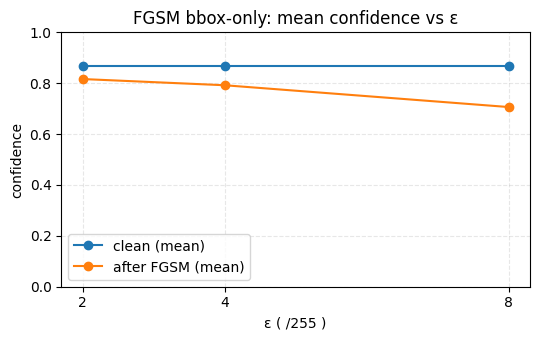

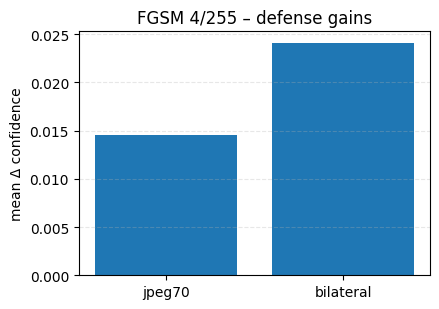

FGSM-4 defenses:
            mean_before  mean_after  mean_gain  improved     n
jpeg70        0.792007    0.806530   0.014523      18.0  20.0
bilateral     0.792007    0.816084   0.024078      19.0  20.0


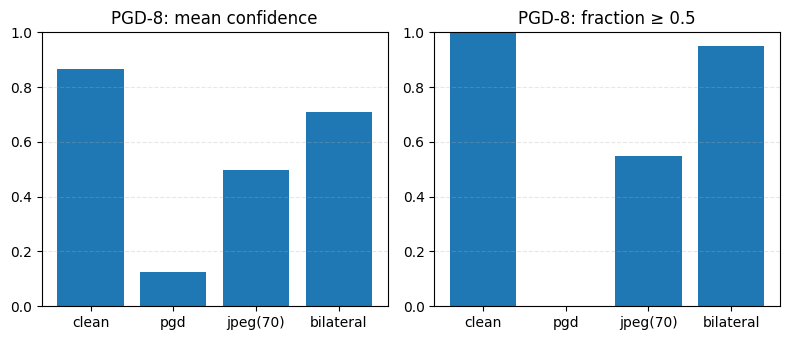

All summaries saved to: /content/drive/MyDrive/CAPSTONE/FINAL_SUMMARY


In [ ]:
import os, pandas as pd, matplotlib.pyplot as plt

# ---- paths ----
FGSM2 = "/content/adv_bbox_eps2_orig/fgsm_bbox_summary_eps2.csv"
FGSM4 = "/content/adv_bbox_eps4_orig/fgsm_bbox_summary_eps4.csv"
FGSM8 = "/content/adv_bbox_eps8_orig/fgsm_bbox_summary_eps8.csv"

FGSM4_JPEG = "/content/defense_on_fgsm4/jpeg70/jpeg70_on_fgsm4_summary.csv"
FGSM4_BIL  = "/content/defense_on_fgsm4/bilateral/bilateral_on_fgsm4_summary.csv"

PGD_SUM    = "/content/pgd_bbox_eps8_orig/pgd_bbox_summary_eps8_a2_k10.csv"
PGD_JPEG   = "/content/defense_on_pgd8/jpeg70/jpeg70_on_pgd8_summary.csv"
PGD_BIL    = "/content/defense_on_pgd8/bilateral_d9_sc75_ss75/bilateral_d9_sc75_ss75_on_pgd8_summary.csv"

OUTDIR = "/content/drive/MyDrive/CAPSTONE/FINAL_SUMMARY"
os.makedirs(OUTDIR, exist_ok=True)

def load_safe(p):
    if os.path.exists(p):
        return pd.read_csv(p)
    else:
        print("Missing:", p); return None

# ========== 1) FGSM sweep summary ==========
dfs = [(2, load_safe(FGSM2)), (4, load_safe(FGSM4)), (8, load_safe(FGSM8))]
fgsm_rows = []
for eps, df in dfs:
    if df is None: continue
    fgsm_rows.append({
        "eps": eps,
        "mean_before": df["conf_before"].mean(),
        "mean_after":  df["conf_after"].mean(),
        "mean_drop":  (df["conf_before"] - df["conf_after"]).mean(),
        "frac_below_0.5": float((df["conf_after"] < 0.5).mean())
    })
fgsm_sum = pd.DataFrame(fgsm_rows).sort_values("eps")
fgsm_sum.to_csv(os.path.join(OUTDIR, "fgsm_sweep_summary.csv"), index=False)

# plot
if not fgsm_sum.empty:
    plt.figure(figsize=(5.5,3.5))
    plt.plot(fgsm_sum["eps"], fgsm_sum["mean_before"], marker="o", label="clean (mean)")
    plt.plot(fgsm_sum["eps"], fgsm_sum["mean_after"],  marker="o", label="after FGSM (mean)")
    plt.xlabel("ε ( /255 )"); plt.ylabel("confidence"); plt.xticks([2,4,8])
    plt.ylim(0,1); plt.grid(True, ls="--", alpha=.3); plt.legend()
    plt.title("FGSM bbox-only: mean confidence vs ε")
    plt.tight_layout()
    plt.savefig(os.path.join(OUTDIR, "fgsm_sweep_means.png"), dpi=160)
    plt.show()

# ========== 2) FGSM-4 defenses: JPEG vs Bilateral ==========
df_j = load_safe(FGSM4_JPEG)
df_b = load_safe(FGSM4_BIL)
if df_j is not None and df_b is not None:
    def stat(df):
        return pd.Series({
            "mean_before": df["conf_before"].mean(),
            "mean_after":  df["conf_after"].mean(),
            "mean_gain":  (df["conf_after"] - df["conf_before"]).mean(),
            "improved": int((df["conf_after"] > df["conf_before"]).sum()),
            "n": len(df)
        })
    s_j, s_b = stat(df_j), stat(df_b)
    comp = pd.DataFrame([s_j, s_b], index=["jpeg70","bilateral"])
    comp.to_csv(os.path.join(OUTDIR, "fgsm4_defenses_summary.csv"))

    # bar of gains
    plt.figure(figsize=(4.5,3.2))
    plt.bar(comp.index, comp["mean_gain"])
    plt.ylabel("mean Δ confidence")
    plt.title("FGSM 4/255 – defense gains")
    plt.grid(axis="y", ls="--", alpha=.3)
    plt.tight_layout()
    plt.savefig(os.path.join(OUTDIR, "fgsm4_defenses_bar.png"), dpi=160)
    plt.show()
    print("FGSM-4 defenses:\n", comp)

# ========== 3) PGD-8 defenses: means + fraction ≥0.5 ==========
dfp = load_safe(PGD_SUM)
dfj = load_safe(PGD_JPEG)
dfb = load_safe(PGD_BIL)

if dfp is not None and dfj is not None and dfb is not None:

    dfp = dfp.rename(columns={"conf_before":"clean","conf_after":"pgd"})
    df = dfp[["image","clean","pgd"]].merge(dfj[["image","conf_after"]].rename(columns={"conf_after":"jpeg"}), on="image") \
                                     .merge(dfb[["image","conf_after"]].rename(columns={"conf_after":"bilateral"}), on="image")
    means = [df["clean"].mean(), df["pgd"].mean(), df["jpeg"].mean(), df["bilateral"].mean()]
    labels= ["clean","pgd","jpeg(70)","bilateral"]
    frac  = [(df[c] >= 0.5).mean() for c in ["clean","pgd","jpeg","bilateral"]]

    # save table
    pd.DataFrame({
        "metric": ["mean_conf_clean","mean_conf_pgd","mean_conf_jpeg","mean_conf_bilateral",
                   "frac>=0.5_clean","frac>=0.5_pgd","frac>=0.5_jpeg","frac>=0.5_bilateral"],
        "value":  [means[0],means[1],means[2],means[3], frac[0],frac[1],frac[2],frac[3]]
    }).to_csv(os.path.join(OUTDIR, "pgd8_defenses_summary.csv"), index=False)

    # plot
    plt.figure(figsize=(8,3.5))
    plt.subplot(1,2,1); plt.bar(labels, means); plt.ylim(0,1); plt.title("PGD-8: mean confidence"); plt.grid(axis="y", ls="--", alpha=.3)
    plt.subplot(1,2,2); plt.bar(labels, frac);  plt.ylim(0,1); plt.title("PGD-8: fraction ≥ 0.5"); plt.grid(axis="y", ls="--", alpha=.3)
    plt.tight_layout()
    plt.savefig(os.path.join(OUTDIR, "pgd8_defenses_panels.png"), dpi=160)
    plt.show()

print("All summaries saved to:", OUTDIR)
